In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

In [12]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1138, done.
remote: Counting objects: 100% (204/204), done.
remote: Compressing objects: 100% (120/120), done.
remote: Total 1138 (delta 131), reused 149 (delta 84), pack-reused 934
Receiving objects: 100% (1138/1138), 39.34 MiB | 36.89 MiB/s, done.
Resolving deltas: 100% (793/793), done.


In [13]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_invgamma_gamma, make_lm_program_invgamma_gamma_batched
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution
from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.Evaluation.Evaluate import Evaluate

In [14]:
torch.backends.cudnn.benchmark = True

In [15]:
N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/evaluation_PFN_Experiments_CFM_InvGammaGamma_coupling_LearnedBaseDist_plus_nll_Curriculum_v1"
#BATCH_SIZE = 128

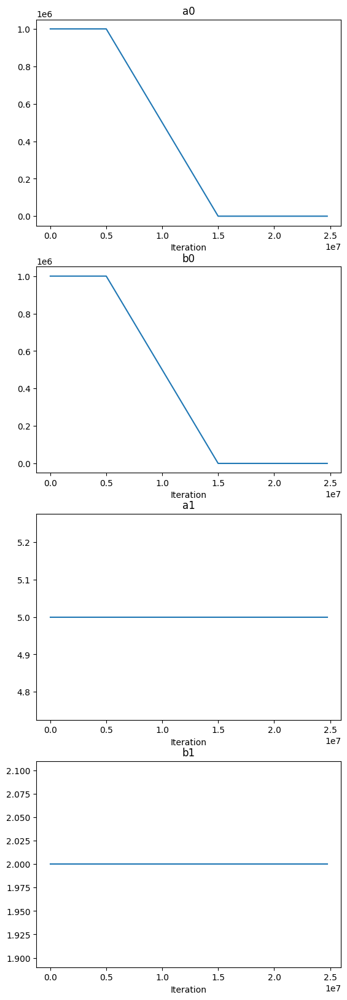

In [16]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("a0", curriculum.constant_than_linear_than_constant_scheduler(start_value = 1e6, end_value = 4.4798, fraction_constant_beginning = 0.2, fraction_constant_end = 0.4)),
    ("b0", curriculum.constant_than_linear_than_constant_scheduler(start_value = 1e6 + 1, end_value = 4.4798 +1, fraction_constant_beginning = 0.2, fraction_constant_end = 0.4)),
    ("a1", curriculum.constant_scheduler(5.0)),
    ("b1",curriculum.constant_scheduler(2.0)),
    ]
)
curriculum.plot_all_schedules()

In [17]:
curriculum.get_params(99*N_SAMPLES_PER_EPOCH)

{'a0': 4.4798, 'b0': 5.4798, 'a1': 5.0, 'b1': 2.0}

In [18]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_invgamma_gamma_batched,
    curriculum= curriculum,
    #coupling = None
)

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 69.46it/s]

{'X': {'mean': tensor(0.5005), 'variance': tensor(0.0834), 'min': tensor(9.5367e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(-0.0408), 'variance': tensor(2.0784), 'min': tensor(-8.8688), 'max': tensor(7.9933)}, 'beta': {'mean': tensor([-0.0011,  0.0233, -0.0401, -0.0200, -0.0455]), 'variance': tensor([1.0178, 1.0014, 0.9995, 1.0166, 1.0771]), 'min': tensor([-3.2747, -3.6007, -3.4273, -3.1114, -3.6201]), 'max': tensor([3.3612, 3.6576, 3.7765, 3.4244, 3.5785])}}
Statistics for sigma_squared:
Mean: tensor([0.4936])
Variance: tensor([0.0740])
Min: tensor([0.1009])
Max: tensor([3.2232])


Statistics for beta_var:
Mean: tensor([1.0000])
Variance: tensor([9.9534e-07])
Min: tensor([0.9968])
Max: tensor([1.0034])


Statistics for time:
Mean: 0.509899743180722
Variance: 0.0840712933304197
Min: 0.0002478957176208496


Max: 0.9998063445091248


Statistics for base_sample_beta:
Mean: tensor([ 0.0312,  0.0023, -0.0106,  0.0377, -0.0197])
Variance: tensor([0.9964, 0.9981, 0.9934, 0.9669, 1.0248])
Min: tensor([-3.1481, -3.2443, -3.4840, -3.1213, -3.3781])
Max: tensor([3.4102, 3.6465, 3.3148, 3.1148, 4.1694])




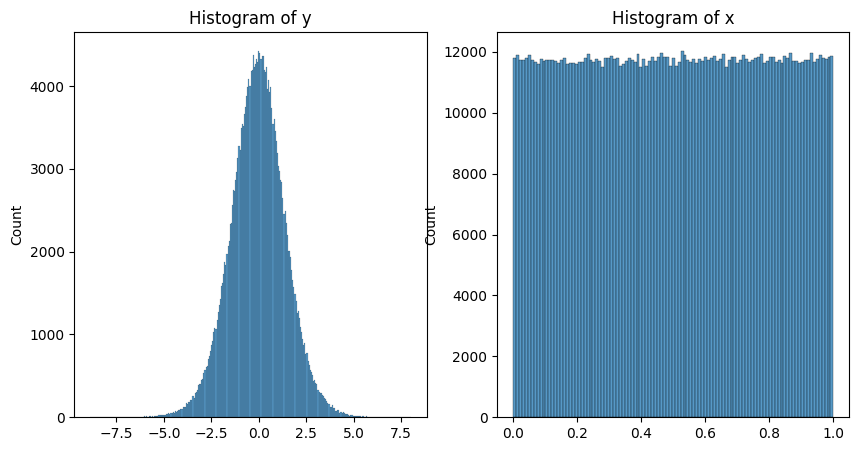

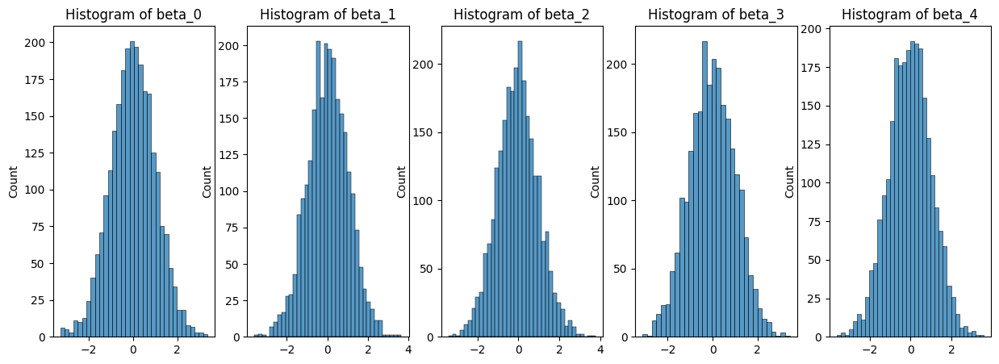

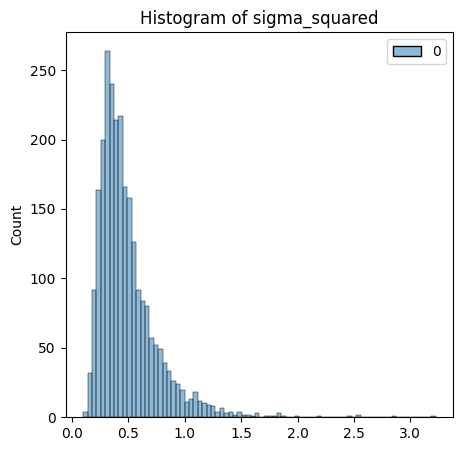

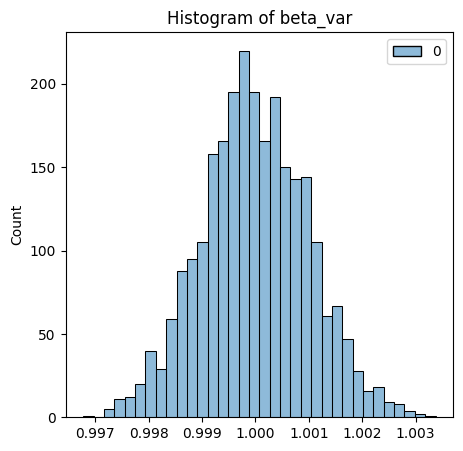

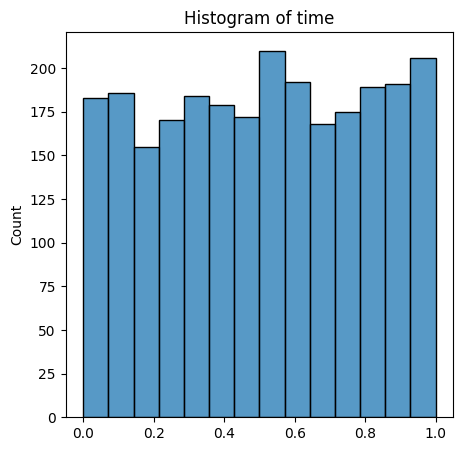

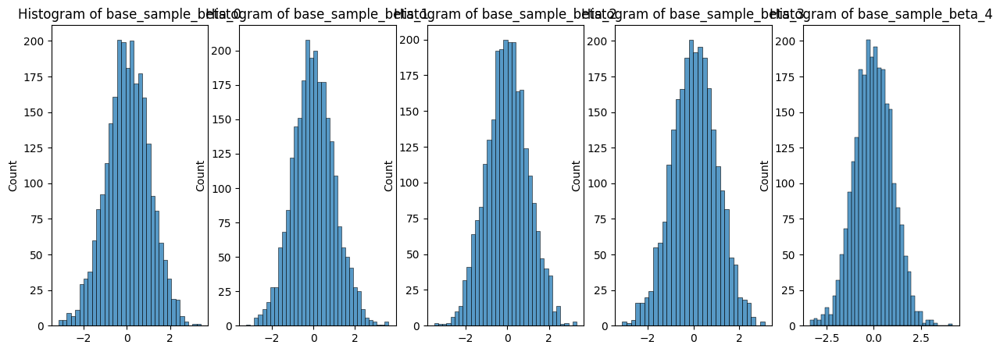

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 71.26it/s]

{'X': {'mean': tensor(0.5000), 'variance': tensor(0.0834), 'min': tensor(1.0729e-06), 'max': tensor(1.0000)}, 'y': {'mean': tensor(0.0099), 'variance': tensor(1.6804), 'min': tensor(-10.5344), 'max': tensor(9.6042)}, 'beta': {'mean': tensor([ 0.0084, -0.0189, -0.0138,  0.0110,  0.0309]), 'variance': tensor([0.7733, 0.7982, 0.8587, 0.7933, 0.8340]), 'min': tensor([-3.3874, -4.1479, -4.0483, -3.5250, -4.5649]), 'max': tensor([3.3049, 3.3335, 3.5845, 3.5863, 3.5686])}}
Statistics for sigma_squared:
Mean: tensor([0.5037])
Variance: tensor([0.0861])
Min: tensor([0.1178])
Max: tensor([3.9773])


Statistics for beta_var:
Mean: tensor([0.8163])
Variance: tensor([0.1518])
Min: tensor([0.0850])
Max: tensor([2.6685])


Statistics for time:
Mean: 0.5077086697565392
Variance: 0.08139861080869756
Min: 4.172325134277344e-05
Max: 0.9997519254684448


Statistics for base_sample_beta:
Mean: tensor([ 0.0058,  0.0103,  0.0207,  0.0304, -0.0236])
Variance: tensor([0.9393, 1.0072, 0.9513, 1.0049, 0.9849])
M

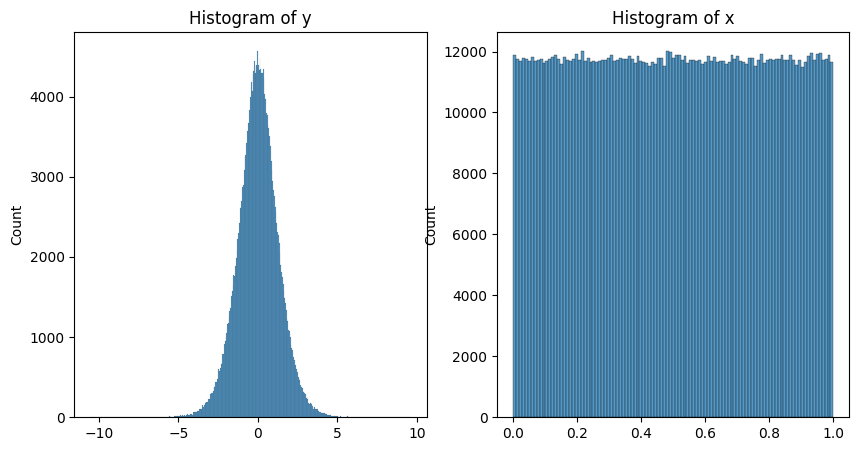

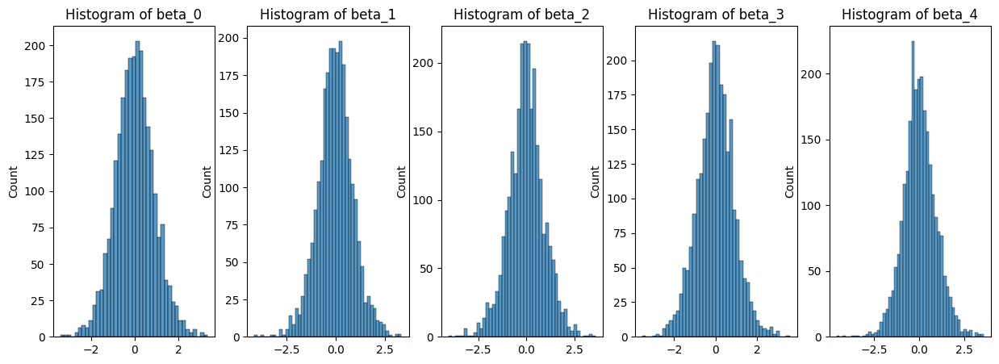

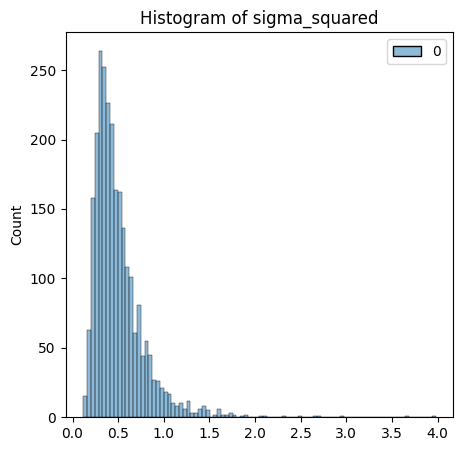

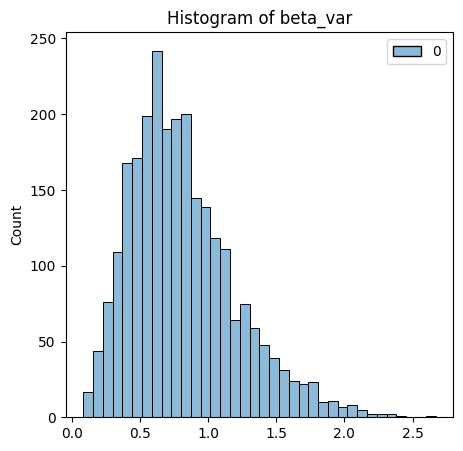

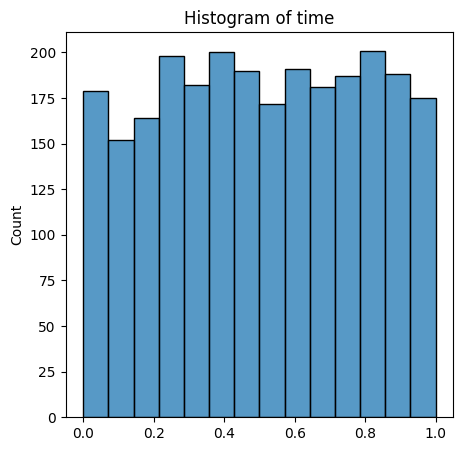

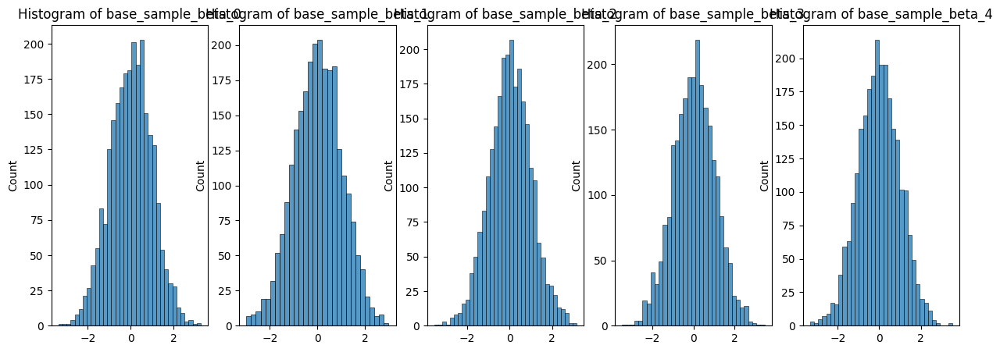

[{'X': {'mean': tensor(0.5005),
   'variance': tensor(0.0834),
   'min': tensor(9.5367e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(-0.0408),
   'variance': tensor(2.0784),
   'min': tensor(-8.8688),
   'max': tensor(7.9933)},
  'beta': {'mean': tensor([-0.0011,  0.0233, -0.0401, -0.0200, -0.0455]),
   'variance': tensor([1.0178, 1.0014, 0.9995, 1.0166, 1.0771]),
   'min': tensor([-3.2747, -3.6007, -3.4273, -3.1114, -3.6201]),
   'max': tensor([3.3612, 3.6576, 3.7765, 3.4244, 3.5785])}},
 {'X': {'mean': tensor(0.5000),
   'variance': tensor(0.0834),
   'min': tensor(1.0729e-06),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(0.0099),
   'variance': tensor(1.6804),
   'min': tensor(-10.5344),
   'max': tensor(9.6042)},
  'beta': {'mean': tensor([ 0.0084, -0.0189, -0.0138,  0.0110,  0.0309]),
   'variance': tensor([0.7733, 0.7982, 0.8587, 0.7933, 0.8340]),
   'min': tensor([-3.3874, -4.1479, -4.0483, -3.5250, -4.5649]),
   'max': tensor([3.3049, 3.3335, 3.5845, 3.5863, 3.56

In [19]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)

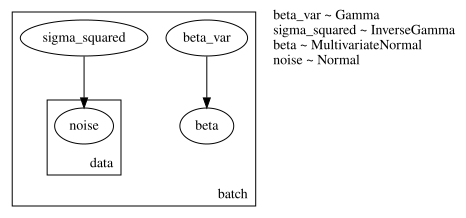

In [20]:
data_generator.render_model()

In [21]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [22]:
save_path_model = "/content/drive/MyDrive/PFN_Experiments/Training_Runs/experiment_2024_05_29_07_37_35/model.pth"

In [23]:
encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 512,
    n_heads= 8,
    dim_feedforward=512*2,
    dropout_rate = 0.1,
    n_layers=6,
    n_skip_layers_final_heads = 2,
    n_output_units_per_head=[P, P*P, P]
)

encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples

model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 1024,
    n_hidden_units= 1024,
    n_skip_layers= 3,
    dropout_rate = 0.1
)

mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 8,
    d_ff = 512*2,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 6,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 1024,
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
    encoder = encoder,
    model_posterior = model_posterior,
    mlp_to_process_encoder_output = mlp_to_process_encoder_output,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [24]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [25]:
'{:.2e}'.format(count_parameters(model))

'9.63e+07'

In [26]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [27]:
lr = 1e-4
opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

In [28]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.5,
    NLL_Loss_function= nll_loss,
    sigma_min=0.0,
    return_sub_losses=True
)

In [29]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e2)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [ ]:
#?TrainerCurriculumCNF

In [30]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    max_gradient_norm = 1.0

)

In [31]:
trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_13_17_21_22")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_13_17_21_22'

In [32]:
try:
  trainer.load_best_model()
except Exception as e:
  print("Could not load model")
  print(e)
  pass

In [67]:
trainer.validate()

  0%|          | 0/49 [00:03<?, ?it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 200.00 MiB. GPU 

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'a0': 1000000.0, 'b0': 1000001.0, 'a1': 5.0, 'b1': 2.0} at iteration 0


100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 0:
Training: {'loss_mean': -1.0758150815963745, 'loss_median': -1.1264009475708008, 'loss_std': 0.23184287548065186, 'loss_FM_mean': 0.8626957535743713, 'loss_FM_median': 0.7518088221549988, 'loss_FM_std': 0.4253365695476532, 'loss_NLL_mean': -3.0143258571624756, 'loss_NLL_median': -3.0485057830810547, 'loss_NLL_std': 0.22404365241527557}
Validation: {'loss_mean': -2.141714096069336, 'loss_median': -2.238797426223755, 'loss_std': 0.6257367134094238, 'loss_FM_mean': 0.3538568913936615, 'loss_FM_median': 0.14296655356884003, 'loss_FM_std': 1.1994258165359497, 'loss_NLL_mean': -4.637284755706787, 'loss_NLL_median': -4.635394096374512, 'loss_NLL_std': 0.15000292658805847}
Validation curriculum: {'loss_mean': -2.2149205207824707, 'loss_median': -2.2654576301574707, 'loss_std': 0.2810172438621521, 'loss_FM_mean': 0.25239652395248413, 'loss_FM_median': 0.13791953027248383, 'loss_FM_std': 0.5445900559425354, 'loss_NLL_mean': -4.6822381019592285, 'loss_NLL_median': -4.683004856109619, 'lo

100%|██████████| 49/49 [00:32<00:00,  1.53it/s]


Epoch 1:
Training: {'loss_mean': -1.2809696197509766, 'loss_median': -1.2941811084747314, 'loss_std': 0.13535787165164948, 'loss_FM_mean': 0.4639737904071808, 'loss_FM_median': 0.4481844902038574, 'loss_FM_std': 0.0948706567287445, 'loss_NLL_mean': -3.0259130001068115, 'loss_NLL_median': -3.0659472942352295, 'loss_NLL_std': 0.24558661878108978}
Validation: {'loss_mean': -2.3538637161254883, 'loss_median': -2.345729351043701, 'loss_std': 0.07468100637197495, 'loss_FM_mean': 0.12473087757825851, 'loss_FM_median': 0.11316032707691193, 'loss_FM_std': 0.04485946148633957, 'loss_NLL_mean': -4.832458019256592, 'loss_NLL_median': -4.829545974731445, 'loss_NLL_std': 0.1402425318956375}
Validation curriculum: {'loss_mean': -0.1525530070066452, 'loss_median': -2.3386878967285156, 'loss_std': 15.19758129119873, 'loss_FM_mean': 4.496363162994385, 'loss_FM_median': 0.11498890072107315, 'loss_FM_std': 30.40174674987793, 'loss_NLL_mean': -4.801469326019287, 'loss_NLL_median': -4.800850868225098, 'loss

100%|██████████| 49/49 [00:31<00:00,  1.54it/s]


Epoch 2:
Training: {'loss_mean': -1.3130145072937012, 'loss_median': -1.3313236236572266, 'loss_std': 0.13510005176067352, 'loss_FM_mean': 0.424981027841568, 'loss_FM_median': 0.40764084458351135, 'loss_FM_std': 0.09306365996599197, 'loss_NLL_mean': -3.0510101318359375, 'loss_NLL_median': -3.0975899696350098, 'loss_NLL_std': 0.25055259466171265}
Validation: {'loss_mean': -1.794093132019043, 'loss_median': -2.343250274658203, 'loss_std': 3.711361885070801, 'loss_FM_mean': 1.2028368711471558, 'loss_FM_median': 0.11021359264850616, 'loss_FM_std': 7.435428619384766, 'loss_NLL_mean': -4.791023254394531, 'loss_NLL_median': -4.823160648345947, 'loss_NLL_std': 0.12179742008447647}
Validation curriculum: {'loss_mean': -2.349522113800049, 'loss_median': -2.347616195678711, 'loss_std': 0.06079663336277008, 'loss_FM_mean': 0.12301676720380783, 'loss_FM_median': 0.10768228024244308, 'loss_FM_std': 0.05837284401059151, 'loss_NLL_mean': -4.822061538696289, 'loss_NLL_median': -4.808297634124756, 'loss

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 3:
Training: {'loss_mean': -1.3345903158187866, 'loss_median': -1.3538951873779297, 'loss_std': 0.13460174202919006, 'loss_FM_mean': 0.383748322725296, 'loss_FM_median': 0.3749232292175293, 'loss_FM_std': 0.07030006498098373, 'loss_NLL_mean': -3.052929162979126, 'loss_NLL_median': -3.104644775390625, 'loss_NLL_std': 0.2593257427215576}
Validation: {'loss_mean': -2.3337717056274414, 'loss_median': -2.3376734256744385, 'loss_std': 0.08068255335092545, 'loss_FM_mean': 0.11303587257862091, 'loss_FM_median': 0.10220513492822647, 'loss_FM_std': 0.040429823100566864, 'loss_NLL_mean': -4.780580043792725, 'loss_NLL_median': -4.784773826599121, 'loss_NLL_std': 0.14954780042171478}
Validation curriculum: {'loss_mean': -2.2977354526519775, 'loss_median': -2.308907985687256, 'loss_std': 0.0809059664607048, 'loss_FM_mean': 0.12821729481220245, 'loss_FM_median': 0.10822271555662155, 'loss_FM_std': 0.10938760638237, 'loss_NLL_mean': -4.723688125610352, 'loss_NLL_median': -4.72393798828125, 'loss

100%|██████████| 49/49 [00:30<00:00,  1.62it/s]


Epoch 4:
Training: {'loss_mean': -1.3351678848266602, 'loss_median': -1.349716305732727, 'loss_std': 0.14019787311553955, 'loss_FM_mean': 0.37960928678512573, 'loss_FM_median': 0.3558228015899658, 'loss_FM_std': 0.08485455811023712, 'loss_NLL_mean': -3.049945116043091, 'loss_NLL_median': -3.074634075164795, 'loss_NLL_std': 0.25990933179855347}
Validation: {'loss_mean': -2.268887519836426, 'loss_median': -2.2574005126953125, 'loss_std': 0.0855775997042656, 'loss_FM_mean': 0.12087365239858627, 'loss_FM_median': 0.1111319437623024, 'loss_FM_std': 0.04573741927742958, 'loss_NLL_mean': -4.65864896774292, 'loss_NLL_median': -4.628995418548584, 'loss_NLL_std': 0.1503826081752777}
Validation curriculum: {'loss_mean': -2.266190528869629, 'loss_median': -2.2832303047180176, 'loss_std': 0.10334688425064087, 'loss_FM_mean': 0.14361506700515747, 'loss_FM_median': 0.12104052305221558, 'loss_FM_std': 0.14389415085315704, 'loss_NLL_mean': -4.67599630355835, 'loss_NLL_median': -4.685868263244629, 'loss

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 5:
Training: {'loss_mean': -1.331258773803711, 'loss_median': -1.3453185558319092, 'loss_std': 0.13806621730327606, 'loss_FM_mean': 0.35491979122161865, 'loss_FM_median': 0.34224018454551697, 'loss_FM_std': 0.07769721746444702, 'loss_NLL_mean': -3.017437219619751, 'loss_NLL_median': -3.0479583740234375, 'loss_NLL_std': 0.26796823740005493}
Validation: {'loss_mean': -2.266390085220337, 'loss_median': -2.267893075942993, 'loss_std': 0.07613113522529602, 'loss_FM_mean': 0.12486374378204346, 'loss_FM_median': 0.11775179952383041, 'loss_FM_std': 0.032064009457826614, 'loss_NLL_mean': -4.657643795013428, 'loss_NLL_median': -4.648318290710449, 'loss_NLL_std': 0.136368528008461}
Validation curriculum: {'loss_mean': -2.2315661907196045, 'loss_median': -2.25189471244812, 'loss_std': 0.17790639400482178, 'loss_FM_mean': 0.17084237933158875, 'loss_FM_median': 0.1153334304690361, 'loss_FM_std': 0.3159951865673065, 'loss_NLL_mean': -4.633975505828857, 'loss_NLL_median': -4.635855674743652, 'lo

100%|██████████| 49/49 [00:31<00:00,  1.54it/s]


Epoch 6:
Training: {'loss_mean': -1.3238762617111206, 'loss_median': -1.3414372205734253, 'loss_std': 0.15584975481033325, 'loss_FM_mean': 0.35033077001571655, 'loss_FM_median': 0.33678388595581055, 'loss_FM_std': 0.077496238052845, 'loss_NLL_mean': -2.9980833530426025, 'loss_NLL_median': -3.0399537086486816, 'loss_NLL_std': 0.2985684275627136}
Validation: {'loss_mean': -2.3496642112731934, 'loss_median': -2.341986894607544, 'loss_std': 0.07190582901239395, 'loss_FM_mean': 0.10959408432245255, 'loss_FM_median': 0.10375436395406723, 'loss_FM_std': 0.019663311541080475, 'loss_NLL_mean': -4.808921813964844, 'loss_NLL_median': -4.796590805053711, 'loss_NLL_std': 0.13464707136154175}
Validation curriculum: {'loss_mean': -2.336249589920044, 'loss_median': -2.351138114929199, 'loss_std': 0.07448268681764603, 'loss_FM_mean': 0.11456248164176941, 'loss_FM_median': 0.10694177448749542, 'loss_FM_std': 0.027499165385961533, 'loss_NLL_mean': -4.787062168121338, 'loss_NLL_median': -4.797533512115478

100%|██████████| 49/49 [00:30<00:00,  1.58it/s]


Epoch 7:
Training: {'loss_mean': -1.304877519607544, 'loss_median': -1.3309829235076904, 'loss_std': 0.14680150151252747, 'loss_FM_mean': 0.3333861529827118, 'loss_FM_median': 0.3151155412197113, 'loss_FM_std': 0.0810735821723938, 'loss_NLL_mean': -2.943141222000122, 'loss_NLL_median': -2.9958338737487793, 'loss_NLL_std': 0.2761366367340088}
Validation: {'loss_mean': -2.1094651222229004, 'loss_median': -2.097604990005493, 'loss_std': 0.08138351142406464, 'loss_FM_mean': 0.12104907631874084, 'loss_FM_median': 0.11187221854925156, 'loss_FM_std': 0.03316739946603775, 'loss_NLL_mean': -4.339979648590088, 'loss_NLL_median': -4.316032886505127, 'loss_NLL_std': 0.14569182693958282}
Validation curriculum: {'loss_mean': -2.0973262786865234, 'loss_median': -2.088141441345215, 'loss_std': 0.07445403933525085, 'loss_FM_mean': 0.1278928518295288, 'loss_FM_median': 0.11713270097970963, 'loss_FM_std': 0.03268735110759735, 'loss_NLL_mean': -4.322545051574707, 'loss_NLL_median': -4.333284378051758, 'lo

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 8:
Training: {'loss_mean': -1.329939603805542, 'loss_median': -1.3482062816619873, 'loss_std': 0.11701717227697372, 'loss_FM_mean': 0.3363187611103058, 'loss_FM_median': 0.32449305057525635, 'loss_FM_std': 0.08278623968362808, 'loss_NLL_mean': -2.9961977005004883, 'loss_NLL_median': -3.0394906997680664, 'loss_NLL_std': 0.22415588796138763}
Validation: {'loss_mean': -2.0345869064331055, 'loss_median': -2.037075996398926, 'loss_std': 0.06746641546487808, 'loss_FM_mean': 0.1399231255054474, 'loss_FM_median': 0.13298861682415009, 'loss_FM_std': 0.037893250584602356, 'loss_NLL_mean': -4.209096908569336, 'loss_NLL_median': -4.217955589294434, 'loss_NLL_std': 0.1263790726661682}
Validation curriculum: {'loss_mean': -2.050368547439575, 'loss_median': -2.0553619861602783, 'loss_std': 0.05855132266879082, 'loss_FM_mean': 0.1460859179496765, 'loss_FM_median': 0.1387113630771637, 'loss_FM_std': 0.042217325419187546, 'loss_NLL_mean': -4.246822834014893, 'loss_NLL_median': -4.238031387329102, 

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 9:
Training: {'loss_mean': -1.277725100517273, 'loss_median': -1.2884515523910522, 'loss_std': 0.14583806693553925, 'loss_FM_mean': 0.34975138306617737, 'loss_FM_median': 0.32869648933410645, 'loss_FM_std': 0.09190388768911362, 'loss_NLL_mean': -2.9052016735076904, 'loss_NLL_median': -2.925809621810913, 'loss_NLL_std': 0.27766668796539307}
Validation: {'loss_mean': -2.080432891845703, 'loss_median': -2.0757503509521484, 'loss_std': 0.07960351556539536, 'loss_FM_mean': 0.13580098748207092, 'loss_FM_median': 0.13047312200069427, 'loss_FM_std': 0.03527522832155228, 'loss_NLL_mean': -4.296666622161865, 'loss_NLL_median': -4.289950847625732, 'loss_NLL_std': 0.14092159271240234}
Validation curriculum: {'loss_mean': -2.0400195121765137, 'loss_median': -2.0535857677459717, 'loss_std': 0.0782778263092041, 'loss_FM_mean': 0.14703808724880219, 'loss_FM_median': 0.13605038821697235, 'loss_FM_std': 0.03394631668925285, 'loss_NLL_mean': -4.227077007293701, 'loss_NLL_median': -4.245049476623535

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 10:
Training: {'loss_mean': -1.2688466310501099, 'loss_median': -1.2886914014816284, 'loss_std': 0.13560518622398376, 'loss_FM_mean': 0.34342437982559204, 'loss_FM_median': 0.3300667703151703, 'loss_FM_std': 0.09282715618610382, 'loss_NLL_mean': -2.881117343902588, 'loss_NLL_median': -2.909512519836426, 'loss_NLL_std': 0.24833925068378448}
Validation: {'loss_mean': -1.648247241973877, 'loss_median': -1.6447676420211792, 'loss_std': 0.08872736990451813, 'loss_FM_mean': 0.23167172074317932, 'loss_FM_median': 0.21316075325012207, 'loss_FM_std': 0.12096991389989853, 'loss_NLL_mean': -3.5281660556793213, 'loss_NLL_median': -3.5204882621765137, 'loss_NLL_std': 0.13477076590061188}
Validation curriculum: {'loss_mean': -1.6697468757629395, 'loss_median': -1.672988772392273, 'loss_std': 0.08524378389120102, 'loss_FM_mean': 0.2107463777065277, 'loss_FM_median': 0.21374312043190002, 'loss_FM_std': 0.07930587232112885, 'loss_NLL_mean': -3.5502402782440186, 'loss_NLL_median': -3.5609905719757

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 11:
Training: {'loss_mean': -1.2713481187820435, 'loss_median': -1.2801487445831299, 'loss_std': 0.12592622637748718, 'loss_FM_mean': 0.3488479256629944, 'loss_FM_median': 0.3270237445831299, 'loss_FM_std': 0.08973352611064911, 'loss_NLL_mean': -2.8915445804595947, 'loss_NLL_median': -2.9225993156433105, 'loss_NLL_std': 0.23250412940979004}
Validation: {'loss_mean': -2.064931869506836, 'loss_median': -2.0737967491149902, 'loss_std': 0.0982799232006073, 'loss_FM_mean': 0.1818077117204666, 'loss_FM_median': 0.16724148392677307, 'loss_FM_std': 0.0627349242568016, 'loss_NLL_mean': -4.311671257019043, 'loss_NLL_median': -4.302630424499512, 'loss_NLL_std': 0.15157343447208405}
Validation curriculum: {'loss_mean': -2.0391385555267334, 'loss_median': -2.0418789386749268, 'loss_std': 0.09243971854448318, 'loss_FM_mean': 0.19684621691703796, 'loss_FM_median': 0.19087417423725128, 'loss_FM_std': 0.07576195150613785, 'loss_NLL_mean': -4.2751240730285645, 'loss_NLL_median': -4.2777099609375, 

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 12:
Training: {'loss_mean': -1.2492053508758545, 'loss_median': -1.2648228406906128, 'loss_std': 0.13689203560352325, 'loss_FM_mean': 0.3565850555896759, 'loss_FM_median': 0.3271981477737427, 'loss_FM_std': 0.10165546834468842, 'loss_NLL_mean': -2.8549954891204834, 'loss_NLL_median': -2.9110569953918457, 'loss_NLL_std': 0.2552400231361389}
Validation: {'loss_mean': -1.9445092678070068, 'loss_median': -1.9583569765090942, 'loss_std': 0.08109261095523834, 'loss_FM_mean': 0.1802883893251419, 'loss_FM_median': 0.16825230419635773, 'loss_FM_std': 0.06763076782226562, 'loss_NLL_mean': -4.06930685043335, 'loss_NLL_median': -4.0851545333862305, 'loss_NLL_std': 0.1307709962129593}
Validation curriculum: {'loss_mean': -1.9425081014633179, 'loss_median': -1.9442635774612427, 'loss_std': 0.08536027371883392, 'loss_FM_mean': 0.18368229269981384, 'loss_FM_median': 0.16958610713481903, 'loss_FM_std': 0.06332848221063614, 'loss_NLL_mean': -4.068698406219482, 'loss_NLL_median': -4.055131912231445

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 13:
Training: {'loss_mean': -1.2409225702285767, 'loss_median': -1.2504701614379883, 'loss_std': 0.1261606514453888, 'loss_FM_mean': 0.3547970950603485, 'loss_FM_median': 0.33372220396995544, 'loss_FM_std': 0.10290969163179398, 'loss_NLL_mean': -2.836641788482666, 'loss_NLL_median': -2.8559060096740723, 'loss_NLL_std': 0.24610501527786255}
Validation: {'loss_mean': -1.8199691772460938, 'loss_median': -1.8388344049453735, 'loss_std': 0.08421603590250015, 'loss_FM_mean': 0.18240857124328613, 'loss_FM_median': 0.16134266555309296, 'loss_FM_std': 0.07215532660484314, 'loss_NLL_mean': -3.8223462104797363, 'loss_NLL_median': -3.817702531814575, 'loss_NLL_std': 0.12122221291065216}
Validation curriculum: {'loss_mean': -1.8210746049880981, 'loss_median': -1.8175383806228638, 'loss_std': 0.08609635382890701, 'loss_FM_mean': 0.16944539546966553, 'loss_FM_median': 0.1570407599210739, 'loss_FM_std': 0.05597158893942833, 'loss_NLL_mean': -3.8115947246551514, 'loss_NLL_median': -3.806900262832

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 14:
Training: {'loss_mean': -1.2334893941879272, 'loss_median': -1.2572628259658813, 'loss_std': 0.15730617940425873, 'loss_FM_mean': 0.35826942324638367, 'loss_FM_median': 0.33614012598991394, 'loss_FM_std': 0.0950377881526947, 'loss_NLL_mean': -2.8252482414245605, 'loss_NLL_median': -2.8754069805145264, 'loss_NLL_std': 0.2880233824253082}
Validation: {'loss_mean': -1.9759513139724731, 'loss_median': -1.9901293516159058, 'loss_std': 0.11604505777359009, 'loss_FM_mean': 0.2503395676612854, 'loss_FM_median': 0.2239179164171219, 'loss_FM_std': 0.13277938961982727, 'loss_NLL_mean': -4.202242374420166, 'loss_NLL_median': -4.225595951080322, 'loss_NLL_std': 0.15062963962554932}
Validation curriculum: {'loss_mean': -1.9779127836227417, 'loss_median': -1.987811803817749, 'loss_std': 0.07470622658729553, 'loss_FM_mean': 0.20803198218345642, 'loss_FM_median': 0.18968982994556427, 'loss_FM_std': 0.07681310921907425, 'loss_NLL_mean': -4.163857460021973, 'loss_NLL_median': -4.157999038696289

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 15:
Training: {'loss_mean': -1.2134087085723877, 'loss_median': -1.2282516956329346, 'loss_std': 0.1396128237247467, 'loss_FM_mean': 0.369704008102417, 'loss_FM_median': 0.3502681851387024, 'loss_FM_std': 0.10292455554008484, 'loss_NLL_mean': -2.796520948410034, 'loss_NLL_median': -2.8371710777282715, 'loss_NLL_std': 0.2629430294036865}
Validation: {'loss_mean': -1.9503217935562134, 'loss_median': -1.9711118936538696, 'loss_std': 0.11103478819131851, 'loss_FM_mean': 0.28510820865631104, 'loss_FM_median': 0.24469633400440216, 'loss_FM_std': 0.1309652328491211, 'loss_NLL_mean': -4.185750961303711, 'loss_NLL_median': -4.19026517868042, 'loss_NLL_std': 0.14161807298660278}
Validation curriculum: {'loss_mean': -1.922178030014038, 'loss_median': -1.9496358633041382, 'loss_std': 0.12966395914554596, 'loss_FM_mean': 0.29840409755706787, 'loss_FM_median': 0.27481842041015625, 'loss_FM_std': 0.15630044043064117, 'loss_NLL_mean': -4.142759799957275, 'loss_NLL_median': -4.124593734741211, 'l

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 16:
Training: {'loss_mean': -1.1778182983398438, 'loss_median': -1.2072813510894775, 'loss_std': 0.18861287832260132, 'loss_FM_mean': 0.3902819752693176, 'loss_FM_median': 0.3597211241722107, 'loss_FM_std': 0.1308085024356842, 'loss_NLL_mean': -2.7459192276000977, 'loss_NLL_median': -2.804917812347412, 'loss_NLL_std': 0.3583463430404663}
Validation: {'loss_mean': -1.9481123685836792, 'loss_median': -1.9513059854507446, 'loss_std': 0.10774559527635574, 'loss_FM_mean': 0.2763574719429016, 'loss_FM_median': 0.24539315700531006, 'loss_FM_std': 0.1422647088766098, 'loss_NLL_mean': -4.172581672668457, 'loss_NLL_median': -4.175337791442871, 'loss_NLL_std': 0.13668712973594666}
Validation curriculum: {'loss_mean': -1.9469940662384033, 'loss_median': -1.9552116394042969, 'loss_std': 0.12546534836292267, 'loss_FM_mean': 0.27255165576934814, 'loss_FM_median': 0.24091963469982147, 'loss_FM_std': 0.1861957162618637, 'loss_NLL_mean': -4.166540145874023, 'loss_NLL_median': -4.148168087005615, '

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 17:
Training: {'loss_mean': -1.1756995916366577, 'loss_median': -1.1858458518981934, 'loss_std': 0.1649564653635025, 'loss_FM_mean': 0.4228280484676361, 'loss_FM_median': 0.3979654312133789, 'loss_FM_std': 0.13550449907779694, 'loss_NLL_mean': -2.7742273807525635, 'loss_NLL_median': -2.8024420738220215, 'loss_NLL_std': 0.3041011095046997}
Validation: {'loss_mean': -1.8605066537857056, 'loss_median': -1.8638434410095215, 'loss_std': 0.09935799241065979, 'loss_FM_mean': 0.16803207993507385, 'loss_FM_median': 0.160818412899971, 'loss_FM_std': 0.0661834329366684, 'loss_NLL_mean': -3.889045238494873, 'loss_NLL_median': -3.9046578407287598, 'loss_NLL_std': 0.16960409283638}
Validation curriculum: {'loss_mean': -1.848272681236267, 'loss_median': -1.8549140691757202, 'loss_std': 0.08355225622653961, 'loss_FM_mean': 0.2003142237663269, 'loss_FM_median': 0.1747969537973404, 'loss_FM_std': 0.09138952195644379, 'loss_NLL_mean': -3.896859645843506, 'loss_NLL_median': -3.9214224815368652, 'los

100%|██████████| 49/49 [00:32<00:00,  1.52it/s]


Epoch 18:
Training: {'loss_mean': -1.1856800317764282, 'loss_median': -1.2054823637008667, 'loss_std': 0.13228864967823029, 'loss_FM_mean': 0.418614000082016, 'loss_FM_median': 0.381881445646286, 'loss_FM_std': 0.1467188149690628, 'loss_NLL_mean': -2.789973735809326, 'loss_NLL_median': -2.832566738128662, 'loss_NLL_std': 0.22996148467063904}
Validation: {'loss_mean': -2.0390148162841797, 'loss_median': -2.0336246490478516, 'loss_std': 0.09271901100873947, 'loss_FM_mean': 0.2293122112751007, 'loss_FM_median': 0.20466876029968262, 'loss_FM_std': 0.11275739967823029, 'loss_NLL_mean': -4.307342529296875, 'loss_NLL_median': -4.307886123657227, 'loss_NLL_std': 0.12596864998340607}
Validation curriculum: {'loss_mean': -2.0245249271392822, 'loss_median': -2.0257749557495117, 'loss_std': 0.08960296213626862, 'loss_FM_mean': 0.20242492854595184, 'loss_FM_median': 0.1953008621931076, 'loss_FM_std': 0.1160791665315628, 'loss_NLL_mean': -4.251474380493164, 'loss_NLL_median': -4.247792720794678, 'lo

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 19:
Training: {'loss_mean': -1.1990028619766235, 'loss_median': -1.2155966758728027, 'loss_std': 0.1575058400630951, 'loss_FM_mean': 0.3866824209690094, 'loss_FM_median': 0.3572939336299896, 'loss_FM_std': 0.11929725855588913, 'loss_NLL_mean': -2.7846879959106445, 'loss_NLL_median': -2.837101459503174, 'loss_NLL_std': 0.2882554233074188}
Validation: {'loss_mean': -1.4144697189331055, 'loss_median': -1.4242780208587646, 'loss_std': 0.11913567781448364, 'loss_FM_mean': 0.36859774589538574, 'loss_FM_median': 0.36099526286125183, 'loss_FM_std': 0.15251551568508148, 'loss_NLL_mean': -3.1975369453430176, 'loss_NLL_median': -3.200103998184204, 'loss_NLL_std': 0.12574416399002075}
Validation curriculum: {'loss_mean': -1.3721688985824585, 'loss_median': -1.3955711126327515, 'loss_std': 0.12256897240877151, 'loss_FM_mean': 0.4252223074436188, 'loss_FM_median': 0.3694484829902649, 'loss_FM_std': 0.20475350320339203, 'loss_NLL_mean': -3.169559955596924, 'loss_NLL_median': -3.1740031242370605

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 20:
Training: {'loss_mean': -1.197435736656189, 'loss_median': -1.2186944484710693, 'loss_std': 0.1457112729549408, 'loss_FM_mean': 0.3872321844100952, 'loss_FM_median': 0.3621528148651123, 'loss_FM_std': 0.12313713878393173, 'loss_NLL_mean': -2.7821037769317627, 'loss_NLL_median': -2.8302454948425293, 'loss_NLL_std': 0.2566956877708435}
Validation: {'loss_mean': -1.7680561542510986, 'loss_median': -1.7895946502685547, 'loss_std': 0.12464539706707001, 'loss_FM_mean': 0.20654603838920593, 'loss_FM_median': 0.17204079031944275, 'loss_FM_std': 0.11160476505756378, 'loss_NLL_mean': -3.7426583766937256, 'loss_NLL_median': -3.770414113998413, 'loss_NLL_std': 0.1684371381998062}
Validation curriculum: {'loss_mean': -1.7627261877059937, 'loss_median': -1.7538957595825195, 'loss_std': 0.09731356054544449, 'loss_FM_mean': 0.24593907594680786, 'loss_FM_median': 0.20693135261535645, 'loss_FM_std': 0.1426423341035843, 'loss_NLL_mean': -3.7713916301727295, 'loss_NLL_median': -3.795275449752807

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 21:
Training: {'loss_mean': -1.2093337774276733, 'loss_median': -1.2377724647521973, 'loss_std': 0.19213424623012543, 'loss_FM_mean': 0.37565878033638, 'loss_FM_median': 0.36010321974754333, 'loss_FM_std': 0.11051679402589798, 'loss_NLL_mean': -2.7943263053894043, 'loss_NLL_median': -2.8433637619018555, 'loss_NLL_std': 0.35572460293769836}
Validation: {'loss_mean': -1.9774364233016968, 'loss_median': -1.978975534439087, 'loss_std': 0.10342539846897125, 'loss_FM_mean': 0.2251107096672058, 'loss_FM_median': 0.18986518681049347, 'loss_FM_std': 0.12102697789669037, 'loss_NLL_mean': -4.179983615875244, 'loss_NLL_median': -4.183387756347656, 'loss_NLL_std': 0.12858536839485168}
Validation curriculum: {'loss_mean': -1.9675264358520508, 'loss_median': -1.990632176399231, 'loss_std': 0.08988834172487259, 'loss_FM_mean': 0.2216522991657257, 'loss_FM_median': 0.2069532871246338, 'loss_FM_std': 0.09250982105731964, 'loss_NLL_mean': -4.156705379486084, 'loss_NLL_median': -4.176450729370117, '

100%|██████████| 49/49 [00:32<00:00,  1.52it/s]


Epoch 22:
Training: {'loss_mean': -1.2468050718307495, 'loss_median': -1.268478274345398, 'loss_std': 0.14328771829605103, 'loss_FM_mean': 0.3573267161846161, 'loss_FM_median': 0.35014399886131287, 'loss_FM_std': 0.10644060373306274, 'loss_NLL_mean': -2.8509366512298584, 'loss_NLL_median': -2.9044737815856934, 'loss_NLL_std': 0.253696471452713}
Validation: {'loss_mean': -2.0080580711364746, 'loss_median': -2.026247978210449, 'loss_std': 0.1522257924079895, 'loss_FM_mean': 0.3400592803955078, 'loss_FM_median': 0.28468284010887146, 'loss_FM_std': 0.2811111807823181, 'loss_NLL_mean': -4.356175422668457, 'loss_NLL_median': -4.368655204772949, 'loss_NLL_std': 0.16125141084194183}
Validation curriculum: {'loss_mean': -2.045273542404175, 'loss_median': -2.0443272590637207, 'loss_std': 0.14642255008220673, 'loss_FM_mean': 0.27952590584754944, 'loss_FM_median': 0.22006335854530334, 'loss_FM_std': 0.1839827001094818, 'loss_NLL_mean': -4.370072841644287, 'loss_NLL_median': -4.3658246994018555, 'l

100%|██████████| 49/49 [00:31<00:00,  1.54it/s]


Epoch 23:
Training: {'loss_mean': -1.1890467405319214, 'loss_median': -1.2175763845443726, 'loss_std': 0.15602247416973114, 'loss_FM_mean': 0.3698062300682068, 'loss_FM_median': 0.34268102049827576, 'loss_FM_std': 0.11489861458539963, 'loss_NLL_mean': -2.7478995323181152, 'loss_NLL_median': -2.801314353942871, 'loss_NLL_std': 0.3036816716194153}
Validation: {'loss_mean': -2.0067667961120605, 'loss_median': -2.029207706451416, 'loss_std': 0.11354399472475052, 'loss_FM_mean': 0.19778357446193695, 'loss_FM_median': 0.17610153555870056, 'loss_FM_std': 0.11322907358407974, 'loss_NLL_mean': -4.211317539215088, 'loss_NLL_median': -4.209755897521973, 'loss_NLL_std': 0.14295214414596558}
Validation curriculum: {'loss_mean': -2.0207552909851074, 'loss_median': -2.0148375034332275, 'loss_std': 0.10006945580244064, 'loss_FM_mean': 0.17779771983623505, 'loss_FM_median': 0.14948312938213348, 'loss_FM_std': 0.08723150938749313, 'loss_NLL_mean': -4.219308853149414, 'loss_NLL_median': -4.21769189834594

100%|██████████| 49/49 [00:31<00:00,  1.54it/s]


Epoch 24:
Training: {'loss_mean': -1.2233083248138428, 'loss_median': -1.2447011470794678, 'loss_std': 0.1790436953306198, 'loss_FM_mean': 0.35230275988578796, 'loss_FM_median': 0.33235231041908264, 'loss_FM_std': 0.10978945344686508, 'loss_NLL_mean': -2.798919677734375, 'loss_NLL_median': -2.836758852005005, 'loss_NLL_std': 0.33171048760414124}
Validation: {'loss_mean': -1.3607358932495117, 'loss_median': -1.3658517599105835, 'loss_std': 0.09372132271528244, 'loss_FM_mean': 0.2015613466501236, 'loss_FM_median': 0.16443629562854767, 'loss_FM_std': 0.10869671404361725, 'loss_NLL_mean': -2.923032760620117, 'loss_NLL_median': -2.919924259185791, 'loss_NLL_std': 0.13627733290195465}
Validation curriculum: {'loss_mean': -1.3389652967453003, 'loss_median': -1.3594861030578613, 'loss_std': 0.0878419578075409, 'loss_FM_mean': 0.19925557076931, 'loss_FM_median': 0.19039280712604523, 'loss_FM_std': 0.08916161209344864, 'loss_NLL_mean': -2.8771860599517822, 'loss_NLL_median': -2.880368232727051, 

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 25:
Training: {'loss_mean': -1.2432917356491089, 'loss_median': -1.259393572807312, 'loss_std': 0.15722769498825073, 'loss_FM_mean': 0.3626023828983307, 'loss_FM_median': 0.3337427079677582, 'loss_FM_std': 0.11860600858926773, 'loss_NLL_mean': -2.8491859436035156, 'loss_NLL_median': -2.897059679031372, 'loss_NLL_std': 0.27862805128097534}
Validation: {'loss_mean': -1.6179978847503662, 'loss_median': -1.6458394527435303, 'loss_std': 0.1416221559047699, 'loss_FM_mean': 0.2960842251777649, 'loss_FM_median': 0.2669508755207062, 'loss_FM_std': 0.19974467158317566, 'loss_NLL_mean': -3.5320801734924316, 'loss_NLL_median': -3.533771276473999, 'loss_NLL_std': 0.13567601144313812}
Validation curriculum: {'loss_mean': -1.6513665914535522, 'loss_median': -1.6631245613098145, 'loss_std': 0.1142253652215004, 'loss_FM_mean': 0.24960440397262573, 'loss_FM_median': 0.19899897277355194, 'loss_FM_std': 0.17041872441768646, 'loss_NLL_mean': -3.552337646484375, 'loss_NLL_median': -3.561418056488037, 

100%|██████████| 49/49 [00:32<00:00,  1.53it/s]


Epoch 26:
Training: {'loss_mean': -1.2449325323104858, 'loss_median': -1.2495017051696777, 'loss_std': 0.13089048862457275, 'loss_FM_mean': 0.36528176069259644, 'loss_FM_median': 0.3440187871456146, 'loss_FM_std': 0.118043452501297, 'loss_NLL_mean': -2.855147123336792, 'loss_NLL_median': -2.8718738555908203, 'loss_NLL_std': 0.24391232430934906}
Validation: {'loss_mean': -1.9552204608917236, 'loss_median': -1.941308856010437, 'loss_std': 0.10132427513599396, 'loss_FM_mean': 0.15163201093673706, 'loss_FM_median': 0.12960804998874664, 'loss_FM_std': 0.05607568472623825, 'loss_NLL_mean': -4.062073230743408, 'loss_NLL_median': -4.03813362121582, 'loss_NLL_std': 0.17535357177257538}
Validation curriculum: {'loss_mean': -1.9711856842041016, 'loss_median': -1.967507243156433, 'loss_std': 0.07205259054899216, 'loss_FM_mean': 0.14101792871952057, 'loss_FM_median': 0.1287156641483307, 'loss_FM_std': 0.04428078979253769, 'loss_NLL_mean': -4.0833892822265625, 'loss_NLL_median': -4.084626197814941, 

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 27:
Training: {'loss_mean': -1.2563703060150146, 'loss_median': -1.2768946886062622, 'loss_std': 0.12732957303524017, 'loss_FM_mean': 0.353931725025177, 'loss_FM_median': 0.3416728675365448, 'loss_FM_std': 0.11404293030500412, 'loss_NLL_mean': -2.8666722774505615, 'loss_NLL_median': -2.9087839126586914, 'loss_NLL_std': 0.2363135665655136}
Validation: {'loss_mean': -1.8135677576065063, 'loss_median': -1.8205187320709229, 'loss_std': 0.11302763968706131, 'loss_FM_mean': 0.27106404304504395, 'loss_FM_median': 0.24233348667621613, 'loss_FM_std': 0.1740291714668274, 'loss_NLL_mean': -3.8981995582580566, 'loss_NLL_median': -3.9291257858276367, 'loss_NLL_std': 0.13192033767700195}
Validation curriculum: {'loss_mean': -1.8236830234527588, 'loss_median': -1.8548306226730347, 'loss_std': 0.1420554369688034, 'loss_FM_mean': 0.2758055627346039, 'loss_FM_median': 0.1753368079662323, 'loss_FM_std': 0.20631785690784454, 'loss_NLL_mean': -3.9231717586517334, 'loss_NLL_median': -3.930233478546142

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 28:
Training: {'loss_mean': -1.2747347354888916, 'loss_median': -1.297985315322876, 'loss_std': 0.13059745728969574, 'loss_FM_mean': 0.34149330854415894, 'loss_FM_median': 0.3252091109752655, 'loss_FM_std': 0.10339844971895218, 'loss_NLL_mean': -2.890962600708008, 'loss_NLL_median': -2.9219369888305664, 'loss_NLL_std': 0.24705278873443604}
Validation: {'loss_mean': -1.8209818601608276, 'loss_median': -1.8483335971832275, 'loss_std': 0.13752473890781403, 'loss_FM_mean': 0.33111944794654846, 'loss_FM_median': 0.3039650022983551, 'loss_FM_std': 0.19572235643863678, 'loss_NLL_mean': -3.9730827808380127, 'loss_NLL_median': -3.9638490676879883, 'loss_NLL_std': 0.14140845835208893}
Validation curriculum: {'loss_mean': -1.8268990516662598, 'loss_median': -1.8472795486450195, 'loss_std': 0.14742080867290497, 'loss_FM_mean': 0.32644689083099365, 'loss_FM_median': 0.24696989357471466, 'loss_FM_std': 0.21576964855194092, 'loss_NLL_mean': -3.9802448749542236, 'loss_NLL_median': -3.94937443733

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 29:
Training: {'loss_mean': -1.2555792331695557, 'loss_median': -1.2657643556594849, 'loss_std': 0.12971621751785278, 'loss_FM_mean': 0.34170857071876526, 'loss_FM_median': 0.32027289271354675, 'loss_FM_std': 0.10965428501367569, 'loss_NLL_mean': -2.8528666496276855, 'loss_NLL_median': -2.8950939178466797, 'loss_NLL_std': 0.23816457390785217}
Validation: {'loss_mean': -1.8653751611709595, 'loss_median': -1.8655917644500732, 'loss_std': 0.09930261224508286, 'loss_FM_mean': 0.1935453861951828, 'loss_FM_median': 0.13353188335895538, 'loss_FM_std': 0.11523307859897614, 'loss_NLL_mean': -3.9242959022521973, 'loss_NLL_median': -3.90763521194458, 'loss_NLL_std': 0.12059866636991501}
Validation curriculum: {'loss_mean': -1.8269450664520264, 'loss_median': -1.8486140966415405, 'loss_std': 0.1104704812169075, 'loss_FM_mean': 0.22474072873592377, 'loss_FM_median': 0.17854873836040497, 'loss_FM_std': 0.13159815967082977, 'loss_NLL_mean': -3.8786306381225586, 'loss_NLL_median': -3.88511133193

100%|██████████| 49/49 [00:31<00:00,  1.55it/s]


Epoch 30:
Training: {'loss_mean': -1.253378987312317, 'loss_median': -1.2662162780761719, 'loss_std': 0.1351374238729477, 'loss_FM_mean': 0.36325305700302124, 'loss_FM_median': 0.3450358808040619, 'loss_FM_std': 0.11665592342615128, 'loss_NLL_mean': -2.8700106143951416, 'loss_NLL_median': -2.869591236114502, 'loss_NLL_std': 0.24369050562381744}
Validation: {'loss_mean': -1.65534508228302, 'loss_median': -1.658445119857788, 'loss_std': 0.11196289211511612, 'loss_FM_mean': 0.22526194155216217, 'loss_FM_median': 0.2126821130514145, 'loss_FM_std': 0.11238957941532135, 'loss_NLL_mean': -3.535951852798462, 'loss_NLL_median': -3.5414109230041504, 'loss_NLL_std': 0.14825506508350372}
Validation curriculum: {'loss_mean': -1.653116226196289, 'loss_median': -1.6815783977508545, 'loss_std': 0.11695613712072372, 'loss_FM_mean': 0.25243380665779114, 'loss_FM_median': 0.22338032722473145, 'loss_FM_std': 0.1515336036682129, 'loss_NLL_mean': -3.558666229248047, 'loss_NLL_median': -3.582364082336426, 'l

100%|██████████| 49/49 [00:31<00:00,  1.55it/s]


Epoch 31:
Training: {'loss_mean': -1.2849187850952148, 'loss_median': -1.3069452047348022, 'loss_std': 0.13118721544742584, 'loss_FM_mean': 0.3380761742591858, 'loss_FM_median': 0.31989216804504395, 'loss_FM_std': 0.09891846030950546, 'loss_NLL_mean': -2.9079136848449707, 'loss_NLL_median': -2.9528298377990723, 'loss_NLL_std': 0.2282368540763855}
Validation: {'loss_mean': -1.8753457069396973, 'loss_median': -1.8762173652648926, 'loss_std': 0.0923849567770958, 'loss_FM_mean': 0.16967111825942993, 'loss_FM_median': 0.15513043105602264, 'loss_FM_std': 0.07569487392902374, 'loss_NLL_mean': -3.9203622341156006, 'loss_NLL_median': -3.9152040481567383, 'loss_NLL_std': 0.13743144273757935}
Validation curriculum: {'loss_mean': -1.8802471160888672, 'loss_median': -1.899632215499878, 'loss_std': 0.08891885727643967, 'loss_FM_mean': 0.1910156011581421, 'loss_FM_median': 0.15605412423610687, 'loss_FM_std': 0.09953631460666656, 'loss_NLL_mean': -3.951509952545166, 'loss_NLL_median': -3.9366202354431

100%|██████████| 49/49 [00:31<00:00,  1.55it/s]


Epoch 32:
Training: {'loss_mean': -1.263209342956543, 'loss_median': -1.2808403968811035, 'loss_std': 0.1279987394809723, 'loss_FM_mean': 0.36159905791282654, 'loss_FM_median': 0.3379996716976166, 'loss_FM_std': 0.1239573135972023, 'loss_NLL_mean': -2.888017416000366, 'loss_NLL_median': -2.9257595539093018, 'loss_NLL_std': 0.23180919885635376}
Validation: {'loss_mean': -1.8908756971359253, 'loss_median': -1.907703161239624, 'loss_std': 0.09493406116962433, 'loss_FM_mean': 0.22350379824638367, 'loss_FM_median': 0.18685364723205566, 'loss_FM_std': 0.10782220214605331, 'loss_NLL_mean': -4.005255222320557, 'loss_NLL_median': -4.015738487243652, 'loss_NLL_std': 0.13104858994483948}
Validation curriculum: {'loss_mean': -1.8765417337417603, 'loss_median': -1.8820751905441284, 'loss_std': 0.09307616949081421, 'loss_FM_mean': 0.23875832557678223, 'loss_FM_median': 0.22863149642944336, 'loss_FM_std': 0.08600712567567825, 'loss_NLL_mean': -3.9918415546417236, 'loss_NLL_median': -4.010942459106445

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 33:
Training: {'loss_mean': -1.268713355064392, 'loss_median': -1.2878729104995728, 'loss_std': 0.17544618248939514, 'loss_FM_mean': 0.32666340470314026, 'loss_FM_median': 0.3096756339073181, 'loss_FM_std': 0.09976079314947128, 'loss_NLL_mean': -2.8640902042388916, 'loss_NLL_median': -2.9021880626678467, 'loss_NLL_std': 0.3121834397315979}
Validation: {'loss_mean': -1.8916822671890259, 'loss_median': -1.9035441875457764, 'loss_std': 0.10752394795417786, 'loss_FM_mean': 0.22890032827854156, 'loss_FM_median': 0.2183554470539093, 'loss_FM_std': 0.11016763746738434, 'loss_NLL_mean': -4.012264728546143, 'loss_NLL_median': -4.035636901855469, 'loss_NLL_std': 0.1361737996339798}
Validation curriculum: {'loss_mean': -1.8967959880828857, 'loss_median': -1.8921496868133545, 'loss_std': 0.08003366738557816, 'loss_FM_mean': 0.20417481660842896, 'loss_FM_median': 0.18807435035705566, 'loss_FM_std': 0.07361837476491928, 'loss_NLL_mean': -3.9977669715881348, 'loss_NLL_median': -3.99435997009277

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 34:
Training: {'loss_mean': -1.2732036113739014, 'loss_median': -1.2896122932434082, 'loss_std': 0.14366509020328522, 'loss_FM_mean': 0.311080664396286, 'loss_FM_median': 0.29870930314064026, 'loss_FM_std': 0.08340634405612946, 'loss_NLL_mean': -2.857487916946411, 'loss_NLL_median': -2.9054250717163086, 'loss_NLL_std': 0.26976242661476135}
Validation: {'loss_mean': -1.9214869737625122, 'loss_median': -1.9401577711105347, 'loss_std': 0.13446231186389923, 'loss_FM_mean': 0.3123295307159424, 'loss_FM_median': 0.2658214569091797, 'loss_FM_std': 0.16545775532722473, 'loss_NLL_mean': -4.155303478240967, 'loss_NLL_median': -4.147252082824707, 'loss_NLL_std': 0.1587703377008438}
Validation curriculum: {'loss_mean': -1.959133505821228, 'loss_median': -1.9859060049057007, 'loss_std': 0.12250855565071106, 'loss_FM_mean': 0.2780419588088989, 'loss_FM_median': 0.2397959977388382, 'loss_FM_std': 0.1787504404783249, 'loss_NLL_mean': -4.1963090896606445, 'loss_NLL_median': -4.183606147766113, 'l

100%|██████████| 49/49 [00:32<00:00,  1.52it/s]


Epoch 35:
Training: {'loss_mean': -1.3039506673812866, 'loss_median': -1.3156647682189941, 'loss_std': 0.1308898776769638, 'loss_FM_mean': 0.3158242702484131, 'loss_FM_median': 0.2938539981842041, 'loss_FM_std': 0.10190971940755844, 'loss_NLL_mean': -2.9237258434295654, 'loss_NLL_median': -2.9573769569396973, 'loss_NLL_std': 0.24089442193508148}
Validation: {'loss_mean': -1.8121037483215332, 'loss_median': -1.8145830631256104, 'loss_std': 0.11095140874385834, 'loss_FM_mean': 0.2551747262477875, 'loss_FM_median': 0.24574832618236542, 'loss_FM_std': 0.129377081990242, 'loss_NLL_mean': -3.8793821334838867, 'loss_NLL_median': -3.871133327484131, 'loss_NLL_std': 0.1405538022518158}
Validation curriculum: {'loss_mean': -1.8103244304656982, 'loss_median': -1.8278334140777588, 'loss_std': 0.10482675582170486, 'loss_FM_mean': 0.24522866308689117, 'loss_FM_median': 0.2054818868637085, 'loss_FM_std': 0.13632112741470337, 'loss_NLL_mean': -3.865877389907837, 'loss_NLL_median': -3.8642144203186035,

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 36:
Training: {'loss_mean': -1.2846007347106934, 'loss_median': -1.3083884716033936, 'loss_std': 0.12471961230039597, 'loss_FM_mean': 0.3229345381259918, 'loss_FM_median': 0.3090209662914276, 'loss_FM_std': 0.09779723733663559, 'loss_NLL_mean': -2.8921356201171875, 'loss_NLL_median': -2.9137253761291504, 'loss_NLL_std': 0.22914016246795654}
Validation: {'loss_mean': -1.7467546463012695, 'loss_median': -1.742750883102417, 'loss_std': 0.0948624387383461, 'loss_FM_mean': 0.3199050724506378, 'loss_FM_median': 0.3042208254337311, 'loss_FM_std': 0.12837088108062744, 'loss_NLL_mean': -3.8134143352508545, 'loss_NLL_median': -3.8353078365325928, 'loss_NLL_std': 0.10641645640134811}
Validation curriculum: {'loss_mean': -1.7710723876953125, 'loss_median': -1.7716909646987915, 'loss_std': 0.10704567283391953, 'loss_FM_mean': 0.2836163341999054, 'loss_FM_median': 0.2448088675737381, 'loss_FM_std': 0.14527907967567444, 'loss_NLL_mean': -3.825761079788208, 'loss_NLL_median': -3.8117244243621826

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 37:
Training: {'loss_mean': -1.275915503501892, 'loss_median': -1.306937575340271, 'loss_std': 0.18340201675891876, 'loss_FM_mean': 0.3196794092655182, 'loss_FM_median': 0.30590909719467163, 'loss_FM_std': 0.0876881554722786, 'loss_NLL_mean': -2.8715105056762695, 'loss_NLL_median': -2.9318339824676514, 'loss_NLL_std': 0.34920555353164673}
Validation: {'loss_mean': -1.9002890586853027, 'loss_median': -1.9230844974517822, 'loss_std': 0.144993856549263, 'loss_FM_mean': 0.3763215243816376, 'loss_FM_median': 0.3459779918193817, 'loss_FM_std': 0.24798905849456787, 'loss_NLL_mean': -4.176899433135986, 'loss_NLL_median': -4.188398838043213, 'loss_NLL_std': 0.1214691549539566}
Validation curriculum: {'loss_mean': -1.9183608293533325, 'loss_median': -1.9463741779327393, 'loss_std': 0.14117789268493652, 'loss_FM_mean': 0.3645072877407074, 'loss_FM_median': 0.2982330024242401, 'loss_FM_std': 0.22265325486660004, 'loss_NLL_mean': -4.201228618621826, 'loss_NLL_median': -4.211557865142822, 'los

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 38:
Training: {'loss_mean': -1.3045434951782227, 'loss_median': -1.3208824396133423, 'loss_std': 0.13644498586654663, 'loss_FM_mean': 0.2998395264148712, 'loss_FM_median': 0.27774423360824585, 'loss_FM_std': 0.0828646868467331, 'loss_NLL_mean': -2.908926486968994, 'loss_NLL_median': -2.946131467819214, 'loss_NLL_std': 0.25870949029922485}
Validation: {'loss_mean': -1.7093689441680908, 'loss_median': -1.7364866733551025, 'loss_std': 0.1386968195438385, 'loss_FM_mean': 0.4873501658439636, 'loss_FM_median': 0.4551282823085785, 'loss_FM_std': 0.22582000494003296, 'loss_NLL_mean': -3.906088352203369, 'loss_NLL_median': -3.9012584686279297, 'loss_NLL_std': 0.11646368354558945}
Validation curriculum: {'loss_mean': -1.7321628332138062, 'loss_median': -1.744679570198059, 'loss_std': 0.17377296090126038, 'loss_FM_mean': 0.453390896320343, 'loss_FM_median': 0.39428162574768066, 'loss_FM_std': 0.2641800045967102, 'loss_NLL_mean': -3.9177162647247314, 'loss_NLL_median': -3.9262747764587402, '

100%|██████████| 49/49 [00:32<00:00,  1.52it/s]


Epoch 39:
Training: {'loss_mean': -1.3184688091278076, 'loss_median': -1.337096095085144, 'loss_std': 0.12526866793632507, 'loss_FM_mean': 0.3083750009536743, 'loss_FM_median': 0.29623180627822876, 'loss_FM_std': 0.0886843353509903, 'loss_NLL_mean': -2.9453125, 'loss_NLL_median': -2.9813528060913086, 'loss_NLL_std': 0.23996888101100922}
Validation: {'loss_mean': -1.9538931846618652, 'loss_median': -1.9523179531097412, 'loss_std': 0.10931133478879929, 'loss_FM_mean': 0.27208030223846436, 'loss_FM_median': 0.254861444234848, 'loss_FM_std': 0.12562794983386993, 'loss_NLL_mean': -4.179866790771484, 'loss_NLL_median': -4.1946868896484375, 'loss_NLL_std': 0.138432115316391}
Validation curriculum: {'loss_mean': -1.9712826013565063, 'loss_median': -1.9769067764282227, 'loss_std': 0.11577129364013672, 'loss_FM_mean': 0.2437475621700287, 'loss_FM_median': 0.20549097657203674, 'loss_FM_std': 0.1378960758447647, 'loss_NLL_mean': -4.186313152313232, 'loss_NLL_median': -4.193567276000977, 'loss_NLL_

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 40:
Training: {'loss_mean': -1.3021708726882935, 'loss_median': -1.3303571939468384, 'loss_std': 0.1406533122062683, 'loss_FM_mean': 0.3111124336719513, 'loss_FM_median': 0.2915054261684418, 'loss_FM_std': 0.09329412132501602, 'loss_NLL_mean': -2.915454626083374, 'loss_NLL_median': -2.952770233154297, 'loss_NLL_std': 0.26326218247413635}
Validation: {'loss_mean': -1.827670693397522, 'loss_median': -1.8132425546646118, 'loss_std': 0.08640072494745255, 'loss_FM_mean': 0.1964704394340515, 'loss_FM_median': 0.16539530456066132, 'loss_FM_std': 0.09780862182378769, 'loss_NLL_mean': -3.851811408996582, 'loss_NLL_median': -3.851313352584839, 'loss_NLL_std': 0.1265018731355667}
Validation curriculum: {'loss_mean': -1.8252331018447876, 'loss_median': -1.8197309970855713, 'loss_std': 0.07699333876371384, 'loss_FM_mean': 0.18043117225170135, 'loss_FM_median': 0.16854147613048553, 'loss_FM_std': 0.06716936826705933, 'loss_NLL_mean': -3.830897331237793, 'loss_NLL_median': -3.8170242309570312, 

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 41:
Training: {'loss_mean': -1.308172583580017, 'loss_median': -1.3300119638442993, 'loss_std': 0.13854239881038666, 'loss_FM_mean': 0.30198362469673157, 'loss_FM_median': 0.2842976152896881, 'loss_FM_std': 0.09637071937322617, 'loss_NLL_mean': -2.9183290004730225, 'loss_NLL_median': -2.972658634185791, 'loss_NLL_std': 0.24965591728687286}
Validation: {'loss_mean': -1.9951488971710205, 'loss_median': -1.9897643327713013, 'loss_std': 0.08094657957553864, 'loss_FM_mean': 0.1278667151927948, 'loss_FM_median': 0.11250337213277817, 'loss_FM_std': 0.043281976133584976, 'loss_NLL_mean': -4.118164539337158, 'loss_NLL_median': -4.119029521942139, 'loss_NLL_std': 0.1412060707807541}
Validation curriculum: {'loss_mean': -1.9869368076324463, 'loss_median': -1.9777199029922485, 'loss_std': 0.0792914405465126, 'loss_FM_mean': 0.14760136604309082, 'loss_FM_median': 0.13392339646816254, 'loss_FM_std': 0.05070088803768158, 'loss_NLL_mean': -4.121474742889404, 'loss_NLL_median': -4.112269878387451

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 42:
Training: {'loss_mean': -1.31300950050354, 'loss_median': -1.3208070993423462, 'loss_std': 0.13464783132076263, 'loss_FM_mean': 0.302949458360672, 'loss_FM_median': 0.2810819149017334, 'loss_FM_std': 0.09447217732667923, 'loss_NLL_mean': -2.928968667984009, 'loss_NLL_median': -2.947754144668579, 'loss_NLL_std': 0.250204473733902}
Validation: {'loss_mean': -1.6059197187423706, 'loss_median': -1.597751259803772, 'loss_std': 0.15343236923217773, 'loss_FM_mean': 0.48056846857070923, 'loss_FM_median': 0.4832342267036438, 'loss_FM_std': 0.2536831498146057, 'loss_NLL_mean': -3.6924080848693848, 'loss_NLL_median': -3.706989288330078, 'loss_NLL_std': 0.12939013540744781}
Validation curriculum: {'loss_mean': -1.6297043561935425, 'loss_median': -1.6312280893325806, 'loss_std': 0.1713360846042633, 'loss_FM_mean': 0.42775365710258484, 'loss_FM_median': 0.3600445091724396, 'loss_FM_std': 0.24207238852977753, 'loss_NLL_mean': -3.687162160873413, 'loss_NLL_median': -3.7045106887817383, 'loss

100%|██████████| 49/49 [00:31<00:00,  1.54it/s]


Epoch 43:
Training: {'loss_mean': -1.3315109014511108, 'loss_median': -1.3433542251586914, 'loss_std': 0.13358595967292786, 'loss_FM_mean': 0.30964088439941406, 'loss_FM_median': 0.29082822799682617, 'loss_FM_std': 0.09526089578866959, 'loss_NLL_mean': -2.9726624488830566, 'loss_NLL_median': -2.993422508239746, 'loss_NLL_std': 0.24715778231620789}
Validation: {'loss_mean': -1.9122295379638672, 'loss_median': -1.8950685262680054, 'loss_std': 0.09715992957353592, 'loss_FM_mean': 0.1313917636871338, 'loss_FM_median': 0.12209691107273102, 'loss_FM_std': 0.037153881043195724, 'loss_NLL_mean': -3.9558513164520264, 'loss_NLL_median': -3.9410459995269775, 'loss_NLL_std': 0.17473693192005157}
Validation curriculum: {'loss_mean': -1.90342116355896, 'loss_median': -1.904895305633545, 'loss_std': 0.07494273781776428, 'loss_FM_mean': 0.14526788890361786, 'loss_FM_median': 0.12722580134868622, 'loss_FM_std': 0.04772030562162399, 'loss_NLL_mean': -3.9521100521087646, 'loss_NLL_median': -3.93724298477

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 44:
Training: {'loss_mean': -1.3482688665390015, 'loss_median': -1.3701757192611694, 'loss_std': 0.1268758922815323, 'loss_FM_mean': 0.2777366638183594, 'loss_FM_median': 0.25519952178001404, 'loss_FM_std': 0.08765706419944763, 'loss_NLL_mean': -2.974274158477783, 'loss_NLL_median': -3.0189929008483887, 'loss_NLL_std': 0.24436360597610474}
Validation: {'loss_mean': -1.8910943269729614, 'loss_median': -1.8949763774871826, 'loss_std': 0.08698883652687073, 'loss_FM_mean': 0.22549033164978027, 'loss_FM_median': 0.2082974910736084, 'loss_FM_std': 0.09782108664512634, 'loss_NLL_mean': -4.007678985595703, 'loss_NLL_median': -3.9805164337158203, 'loss_NLL_std': 0.1265803575515747}
Validation curriculum: {'loss_mean': -1.8971538543701172, 'loss_median': -1.8853142261505127, 'loss_std': 0.09929539263248444, 'loss_FM_mean': 0.21993307769298553, 'loss_FM_median': 0.18757164478302002, 'loss_FM_std': 0.10017285495996475, 'loss_NLL_mean': -4.014240264892578, 'loss_NLL_median': -4.01388692855835

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 45:
Training: {'loss_mean': -1.3486708402633667, 'loss_median': -1.371809959411621, 'loss_std': 0.1261318176984787, 'loss_FM_mean': 0.2742043733596802, 'loss_FM_median': 0.2603946030139923, 'loss_FM_std': 0.08050170540809631, 'loss_NLL_mean': -2.971545696258545, 'loss_NLL_median': -3.01707124710083, 'loss_NLL_std': 0.23976051807403564}
Validation: {'loss_mean': -2.044187545776367, 'loss_median': -2.042341470718384, 'loss_std': 0.10832232981920242, 'loss_FM_mean': 0.2296307235956192, 'loss_FM_median': 0.21634642779827118, 'loss_FM_std': 0.11806008964776993, 'loss_NLL_mean': -4.3180060386657715, 'loss_NLL_median': -4.317397117614746, 'loss_NLL_std': 0.15485292673110962}
Validation curriculum: {'loss_mean': -2.0631844997406006, 'loss_median': -2.068932056427002, 'loss_std': 0.09691916406154633, 'loss_FM_mean': 0.22995145618915558, 'loss_FM_median': 0.21135258674621582, 'loss_FM_std': 0.11641870439052582, 'loss_NLL_mean': -4.356320858001709, 'loss_NLL_median': -4.377603530883789, 'lo

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 46:
Training: {'loss_mean': -1.3364547491073608, 'loss_median': -1.350111484527588, 'loss_std': 0.11799994856119156, 'loss_FM_mean': 0.29198357462882996, 'loss_FM_median': 0.27843713760375977, 'loss_FM_std': 0.07895355671644211, 'loss_NLL_mean': -2.964893341064453, 'loss_NLL_median': -2.9910027980804443, 'loss_NLL_std': 0.23102602362632751}
Validation: {'loss_mean': -1.4315602779388428, 'loss_median': -1.4347586631774902, 'loss_std': 0.0916622206568718, 'loss_FM_mean': 0.2549794316291809, 'loss_FM_median': 0.25553378462791443, 'loss_FM_std': 0.11592569202184677, 'loss_NLL_mean': -3.1180996894836426, 'loss_NLL_median': -3.1037802696228027, 'loss_NLL_std': 0.11984569579362869}
Validation curriculum: {'loss_mean': -1.4475253820419312, 'loss_median': -1.458888292312622, 'loss_std': 0.08700761198997498, 'loss_FM_mean': 0.22456958889961243, 'loss_FM_median': 0.18713684380054474, 'loss_FM_std': 0.10642123222351074, 'loss_NLL_mean': -3.1196205615997314, 'loss_NLL_median': -3.130923271179

100%|██████████| 49/49 [00:32<00:00,  1.50it/s]


Epoch 47:
Training: {'loss_mean': -1.3303465843200684, 'loss_median': -1.355207085609436, 'loss_std': 0.1369791477918625, 'loss_FM_mean': 0.279579758644104, 'loss_FM_median': 0.26645177602767944, 'loss_FM_std': 0.08186730742454529, 'loss_NLL_mean': -2.940272569656372, 'loss_NLL_median': -2.9791460037231445, 'loss_NLL_std': 0.2589363753795624}
Validation: {'loss_mean': -1.9780007600784302, 'loss_median': -1.9790217876434326, 'loss_std': 0.0850045457482338, 'loss_FM_mean': 0.10993871092796326, 'loss_FM_median': 0.09753187745809555, 'loss_FM_std': 0.0347309373319149, 'loss_NLL_mean': -4.065939903259277, 'loss_NLL_median': -4.062033653259277, 'loss_NLL_std': 0.15596696734428406}
Validation curriculum: {'loss_mean': -1.9729368686676025, 'loss_median': -1.9749343395233154, 'loss_std': 0.07697074860334396, 'loss_FM_mean': 0.12234865128993988, 'loss_FM_median': 0.11023058742284775, 'loss_FM_std': 0.0434272401034832, 'loss_NLL_mean': -4.068222522735596, 'loss_NLL_median': -4.0997514724731445, '

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 48:
Training: {'loss_mean': -1.331350326538086, 'loss_median': -1.3482561111450195, 'loss_std': 0.1353510022163391, 'loss_FM_mean': 0.29360002279281616, 'loss_FM_median': 0.28168654441833496, 'loss_FM_std': 0.08562716096639633, 'loss_NLL_mean': -2.9563002586364746, 'loss_NLL_median': -2.9931130409240723, 'loss_NLL_std': 0.2537217140197754}
Validation: {'loss_mean': -2.062386989593506, 'loss_median': -2.0487730503082275, 'loss_std': 0.09351038932800293, 'loss_FM_mean': 0.17346414923667908, 'loss_FM_median': 0.14863453805446625, 'loss_FM_std': 0.07822603732347488, 'loss_NLL_mean': -4.2982378005981445, 'loss_NLL_median': -4.281244277954102, 'loss_NLL_std': 0.14628738164901733}
Validation curriculum: {'loss_mean': -2.071470260620117, 'loss_median': -2.0829732418060303, 'loss_std': 0.08422230184078217, 'loss_FM_mean': 0.17445117235183716, 'loss_FM_median': 0.16488629579544067, 'loss_FM_std': 0.06461101025342941, 'loss_NLL_mean': -4.317391395568848, 'loss_NLL_median': -4.32410907745361

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 49:
Training: {'loss_mean': -1.3468097448349, 'loss_median': -1.3714807033538818, 'loss_std': 0.1495053768157959, 'loss_FM_mean': 0.2877648174762726, 'loss_FM_median': 0.2670745551586151, 'loss_FM_std': 0.09171033650636673, 'loss_NLL_mean': -2.98138427734375, 'loss_NLL_median': -3.0090436935424805, 'loss_NLL_std': 0.28262972831726074}
Validation: {'loss_mean': -1.9377909898757935, 'loss_median': -1.9537676572799683, 'loss_std': 0.11307849735021591, 'loss_FM_mean': 0.27192944288253784, 'loss_FM_median': 0.23901239037513733, 'loss_FM_std': 0.13346487283706665, 'loss_NLL_mean': -4.1475114822387695, 'loss_NLL_median': -4.1568450927734375, 'loss_NLL_std': 0.14522580802440643}
Validation curriculum: {'loss_mean': -1.9747953414916992, 'loss_median': -1.9905422925949097, 'loss_std': 0.09288562089204788, 'loss_FM_mean': 0.22512373328208923, 'loss_FM_median': 0.20297876000404358, 'loss_FM_std': 0.10709822177886963, 'loss_NLL_mean': -4.1747145652771, 'loss_NLL_median': -4.1860151290893555, 

100%|██████████| 49/49 [00:31<00:00,  1.55it/s]


Epoch 50:
Training: {'loss_mean': -1.3535218238830566, 'loss_median': -1.3784595727920532, 'loss_std': 0.14933200180530548, 'loss_FM_mean': 0.27055633068084717, 'loss_FM_median': 0.2524110972881317, 'loss_FM_std': 0.08268162608146667, 'loss_NLL_mean': -2.97760009765625, 'loss_NLL_median': -3.023707151412964, 'loss_NLL_std': 0.2764742374420166}
Validation: {'loss_mean': -2.0070154666900635, 'loss_median': -2.0094082355499268, 'loss_std': 0.12483163923025131, 'loss_FM_mean': 0.30998876690864563, 'loss_FM_median': 0.26871368288993835, 'loss_FM_std': 0.1647818386554718, 'loss_NLL_mean': -4.324019908905029, 'loss_NLL_median': -4.304563522338867, 'loss_NLL_std': 0.1384057253599167}
Validation curriculum: {'loss_mean': -2.023977041244507, 'loss_median': -2.046529531478882, 'loss_std': 0.12370637059211731, 'loss_FM_mean': 0.2818027138710022, 'loss_FM_median': 0.22375385463237762, 'loss_FM_std': 0.1788766086101532, 'loss_NLL_mean': -4.329756736755371, 'loss_NLL_median': -4.319178581237793, 'los

100%|██████████| 49/49 [00:30<00:00,  1.62it/s]


Epoch 51:
Training: {'loss_mean': -1.3493402004241943, 'loss_median': -1.3767439126968384, 'loss_std': 0.16307024657726288, 'loss_FM_mean': 0.27981629967689514, 'loss_FM_median': 0.2627256512641907, 'loss_FM_std': 0.09794806689023972, 'loss_NLL_mean': -2.978496551513672, 'loss_NLL_median': -3.028090000152588, 'loss_NLL_std': 0.30096426606178284}
Validation: {'loss_mean': -1.8982776403427124, 'loss_median': -1.8997268676757812, 'loss_std': 0.07581198215484619, 'loss_FM_mean': 0.1871625781059265, 'loss_FM_median': 0.1813543438911438, 'loss_FM_std': 0.07788550108671188, 'loss_NLL_mean': -3.983717679977417, 'loss_NLL_median': -3.967196464538574, 'loss_NLL_std': 0.12826085090637207}
Validation curriculum: {'loss_mean': -1.9144293069839478, 'loss_median': -1.9188612699508667, 'loss_std': 0.10321464389562607, 'loss_FM_mean': 0.1790841519832611, 'loss_FM_median': 0.15472571551799774, 'loss_FM_std': 0.07528865337371826, 'loss_NLL_mean': -4.0079426765441895, 'loss_NLL_median': -4.022458076477051

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 52:
Training: {'loss_mean': -1.3629282712936401, 'loss_median': -1.3784232139587402, 'loss_std': 0.13120928406715393, 'loss_FM_mean': 0.27405402064323425, 'loss_FM_median': 0.261949360370636, 'loss_FM_std': 0.08122885972261429, 'loss_NLL_mean': -2.999910593032837, 'loss_NLL_median': -3.0324501991271973, 'loss_NLL_std': 0.24384653568267822}
Validation: {'loss_mean': -2.008434295654297, 'loss_median': -2.0329761505126953, 'loss_std': 0.10243821889162064, 'loss_FM_mean': 0.2433292418718338, 'loss_FM_median': 0.19215750694274902, 'loss_FM_std': 0.12846626341342926, 'loss_NLL_mean': -4.26019811630249, 'loss_NLL_median': -4.270900249481201, 'loss_NLL_std': 0.1486918032169342}
Validation curriculum: {'loss_mean': -1.9584481716156006, 'loss_median': -1.9757587909698486, 'loss_std': 0.13728077709674835, 'loss_FM_mean': 0.2901937663555145, 'loss_FM_median': 0.26658007502555847, 'loss_FM_std': 0.15170040726661682, 'loss_NLL_mean': -4.207089900970459, 'loss_NLL_median': -4.206527233123779, '

100%|██████████| 49/49 [00:30<00:00,  1.61it/s]


Epoch 53:
Training: {'loss_mean': -1.3658497333526611, 'loss_median': -1.3834260702133179, 'loss_std': 0.1426142454147339, 'loss_FM_mean': 0.2612299621105194, 'loss_FM_median': 0.2430272102355957, 'loss_FM_std': 0.0780080035328865, 'loss_NLL_mean': -2.992929458618164, 'loss_NLL_median': -3.0293359756469727, 'loss_NLL_std': 0.2765786647796631}
Validation: {'loss_mean': -1.9230751991271973, 'loss_median': -1.9238777160644531, 'loss_std': 0.07736047357320786, 'loss_FM_mean': 0.15605582296848297, 'loss_FM_median': 0.14593754708766937, 'loss_FM_std': 0.05169680342078209, 'loss_NLL_mean': -4.002205848693848, 'loss_NLL_median': -3.9827847480773926, 'loss_NLL_std': 0.11880949139595032}
Validation curriculum: {'loss_mean': -1.9530847072601318, 'loss_median': -1.962515950202942, 'loss_std': 0.07432669401168823, 'loss_FM_mean': 0.1396256387233734, 'loss_FM_median': 0.13184282183647156, 'loss_FM_std': 0.041843824088573456, 'loss_NLL_mean': -4.04579496383667, 'loss_NLL_median': -4.054150104522705, 

100%|██████████| 49/49 [00:31<00:00,  1.55it/s]


Epoch 54:
Training: {'loss_mean': -1.381943941116333, 'loss_median': -1.3966535329818726, 'loss_std': 0.11746717244386673, 'loss_FM_mean': 0.2675632834434509, 'loss_FM_median': 0.25927385687828064, 'loss_FM_std': 0.07854076474905014, 'loss_NLL_mean': -3.0314512252807617, 'loss_NLL_median': -3.0695972442626953, 'loss_NLL_std': 0.2267877459526062}
Validation: {'loss_mean': -2.0246641635894775, 'loss_median': -2.021707534790039, 'loss_std': 0.08621199429035187, 'loss_FM_mean': 0.21171455085277557, 'loss_FM_median': 0.19235901534557343, 'loss_FM_std': 0.07399001717567444, 'loss_NLL_mean': -4.261043548583984, 'loss_NLL_median': -4.271991729736328, 'loss_NLL_std': 0.14317727088928223}
Validation curriculum: {'loss_mean': -2.0178143978118896, 'loss_median': -2.055938482284546, 'loss_std': 0.1070752739906311, 'loss_FM_mean': 0.23085401952266693, 'loss_FM_median': 0.18552356958389282, 'loss_FM_std': 0.1353592872619629, 'loss_NLL_mean': -4.266482830047607, 'loss_NLL_median': -4.308270454406738, 

100%|██████████| 49/49 [00:30<00:00,  1.61it/s]


Epoch 55:
Training: {'loss_mean': -1.3802390098571777, 'loss_median': -1.4002702236175537, 'loss_std': 0.14337997138500214, 'loss_FM_mean': 0.2689901292324066, 'loss_FM_median': 0.2540545165538788, 'loss_FM_std': 0.0791037380695343, 'loss_NLL_mean': -3.029468059539795, 'loss_NLL_median': -3.070526599884033, 'loss_NLL_std': 0.27503517270088196}
Validation: {'loss_mean': -2.0589826107025146, 'loss_median': -2.0711145401000977, 'loss_std': 0.09398262947797775, 'loss_FM_mean': 0.2698657214641571, 'loss_FM_median': 0.24604783952236176, 'loss_FM_std': 0.12195830047130585, 'loss_NLL_mean': -4.387831211090088, 'loss_NLL_median': -4.398693084716797, 'loss_NLL_std': 0.10420592129230499}
Validation curriculum: {'loss_mean': -2.0301365852355957, 'loss_median': -2.039060592651367, 'loss_std': 0.11969951540231705, 'loss_FM_mean': 0.28307121992111206, 'loss_FM_median': 0.23447780311107635, 'loss_FM_std': 0.14589698612689972, 'loss_NLL_mean': -4.343344211578369, 'loss_NLL_median': -4.331575393676758, 

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 56:
Training: {'loss_mean': -1.3935954570770264, 'loss_median': -1.4186668395996094, 'loss_std': 0.1370236873626709, 'loss_FM_mean': 0.24920523166656494, 'loss_FM_median': 0.23586450517177582, 'loss_FM_std': 0.06549002975225449, 'loss_NLL_mean': -3.0363962650299072, 'loss_NLL_median': -3.0819036960601807, 'loss_NLL_std': 0.26866066455841064}
Validation: {'loss_mean': -2.020406723022461, 'loss_median': -2.023705005645752, 'loss_std': 0.08064094930887222, 'loss_FM_mean': 0.17608749866485596, 'loss_FM_median': 0.15098604559898376, 'loss_FM_std': 0.06469189375638962, 'loss_NLL_mean': -4.21690034866333, 'loss_NLL_median': -4.226807594299316, 'loss_NLL_std': 0.12461701780557632}
Validation curriculum: {'loss_mean': -2.02769136428833, 'loss_median': -2.0296990871429443, 'loss_std': 0.07333104312419891, 'loss_FM_mean': 0.14974303543567657, 'loss_FM_median': 0.1416376531124115, 'loss_FM_std': 0.04600190743803978, 'loss_NLL_mean': -4.2051262855529785, 'loss_NLL_median': -4.193851470947266,

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 57:
Training: {'loss_mean': -1.3818883895874023, 'loss_median': -1.399425983428955, 'loss_std': 0.1253492832183838, 'loss_FM_mean': 0.24184805154800415, 'loss_FM_median': 0.23286917805671692, 'loss_FM_std': 0.06600624322891235, 'loss_NLL_mean': -3.005624771118164, 'loss_NLL_median': -3.0456559658050537, 'loss_NLL_std': 0.2421354353427887}
Validation: {'loss_mean': -1.9541629552841187, 'loss_median': -1.9555598497390747, 'loss_std': 0.09223849326372147, 'loss_FM_mean': 0.17006969451904297, 'loss_FM_median': 0.16072139143943787, 'loss_FM_std': 0.061981409788131714, 'loss_NLL_mean': -4.078395366668701, 'loss_NLL_median': -4.07074499130249, 'loss_NLL_std': 0.15145714581012726}
Validation curriculum: {'loss_mean': -1.962920069694519, 'loss_median': -1.971293568611145, 'loss_std': 0.08289181441068649, 'loss_FM_mean': 0.16616539657115936, 'loss_FM_median': 0.15339601039886475, 'loss_FM_std': 0.051364537328481674, 'loss_NLL_mean': -4.092005729675293, 'loss_NLL_median': -4.099836826324463

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 58:
Training: {'loss_mean': -1.3974816799163818, 'loss_median': -1.4084231853485107, 'loss_std': 0.13116079568862915, 'loss_FM_mean': 0.24108336865901947, 'loss_FM_median': 0.22504590451717377, 'loss_FM_std': 0.06318709254264832, 'loss_NLL_mean': -3.0360467433929443, 'loss_NLL_median': -3.069905996322632, 'loss_NLL_std': 0.2523747384548187}
Validation: {'loss_mean': -1.8987005949020386, 'loss_median': -1.9120606184005737, 'loss_std': 0.08050157874822617, 'loss_FM_mean': 0.20061874389648438, 'loss_FM_median': 0.18574455380439758, 'loss_FM_std': 0.06849216669797897, 'loss_NLL_mean': -3.9980201721191406, 'loss_NLL_median': -4.025528907775879, 'loss_NLL_std': 0.12068092823028564}
Validation curriculum: {'loss_mean': -1.9360214471817017, 'loss_median': -1.9443095922470093, 'loss_std': 0.09229778498411179, 'loss_FM_mean': 0.18354232609272003, 'loss_FM_median': 0.17135527729988098, 'loss_FM_std': 0.0716906413435936, 'loss_NLL_mean': -4.0555853843688965, 'loss_NLL_median': -4.06183958053

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 59:
Training: {'loss_mean': -1.4103718996047974, 'loss_median': -1.421885371208191, 'loss_std': 0.12484657019376755, 'loss_FM_mean': 0.23755092918872833, 'loss_FM_median': 0.22292904555797577, 'loss_FM_std': 0.06999974697828293, 'loss_NLL_mean': -3.0582945346832275, 'loss_NLL_median': -3.088362693786621, 'loss_NLL_std': 0.23703011870384216}
Validation: {'loss_mean': -1.890275001525879, 'loss_median': -1.873688817024231, 'loss_std': 0.09516774117946625, 'loss_FM_mean': 0.24022071063518524, 'loss_FM_median': 0.22742877900600433, 'loss_FM_std': 0.12388282269239426, 'loss_NLL_mean': -4.02077054977417, 'loss_NLL_median': -4.025870323181152, 'loss_NLL_std': 0.11029387265443802}
Validation curriculum: {'loss_mean': -1.8910324573516846, 'loss_median': -1.8920340538024902, 'loss_std': 0.10772138088941574, 'loss_FM_mean': 0.25621235370635986, 'loss_FM_median': 0.23401260375976562, 'loss_FM_std': 0.11501399427652359, 'loss_NLL_mean': -4.038276672363281, 'loss_NLL_median': -4.036376476287842

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 60:
Training: {'loss_mean': -1.5649956464767456, 'loss_median': -1.5892101526260376, 'loss_std': 0.14193888008594513, 'loss_FM_mean': 0.24266855418682098, 'loss_FM_median': 0.22621369361877441, 'loss_FM_std': 0.07676629722118378, 'loss_NLL_mean': -3.372659921646118, 'loss_NLL_median': -3.4249789714813232, 'loss_NLL_std': 0.27390697598457336}
Validation: {'loss_mean': -1.9714211225509644, 'loss_median': -1.9680323600769043, 'loss_std': 0.07400833070278168, 'loss_FM_mean': 0.18575085699558258, 'loss_FM_median': 0.1658894270658493, 'loss_FM_std': 0.08399366587400436, 'loss_NLL_mean': -4.1285929679870605, 'loss_NLL_median': -4.134390354156494, 'loss_NLL_std': 0.12482605129480362}
Validation curriculum: {'loss_mean': -2.0021615028381348, 'loss_median': -2.00097918510437, 'loss_std': 0.06074885278940201, 'loss_FM_mean': 0.17100736498832703, 'loss_FM_median': 0.16172479093074799, 'loss_FM_std': 0.07230939716100693, 'loss_NLL_mean': -4.17533016204834, 'loss_NLL_median': -4.19302177429199

100%|██████████| 49/49 [00:30<00:00,  1.61it/s]


Epoch 61:
Training: {'loss_mean': -1.5841552019119263, 'loss_median': -1.6000049114227295, 'loss_std': 0.11819447576999664, 'loss_FM_mean': 0.2308545708656311, 'loss_FM_median': 0.2130163013935089, 'loss_FM_std': 0.057397592812776566, 'loss_NLL_mean': -3.399165153503418, 'loss_NLL_median': -3.4382734298706055, 'loss_NLL_std': 0.23601026833057404}
Validation: {'loss_mean': -1.92200767993927, 'loss_median': -1.9241293668746948, 'loss_std': 0.09507761895656586, 'loss_FM_mean': 0.18193110823631287, 'loss_FM_median': 0.17381523549556732, 'loss_FM_std': 0.07868310064077377, 'loss_NLL_mean': -4.025946140289307, 'loss_NLL_median': -4.029340744018555, 'loss_NLL_std': 0.1462077796459198}
Validation curriculum: {'loss_mean': -1.934738039970398, 'loss_median': -1.9292033910751343, 'loss_std': 0.08020131289958954, 'loss_FM_mean': 0.16959497332572937, 'loss_FM_median': 0.15290246903896332, 'loss_FM_std': 0.06971696764230728, 'loss_NLL_mean': -4.039071083068848, 'loss_NLL_median': -4.034939289093018,

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 62:
Training: {'loss_mean': -1.5807175636291504, 'loss_median': -1.5848333835601807, 'loss_std': 0.10382435470819473, 'loss_FM_mean': 0.2419133335351944, 'loss_FM_median': 0.22542467713356018, 'loss_FM_std': 0.07238984107971191, 'loss_NLL_mean': -3.403348684310913, 'loss_NLL_median': -3.413475513458252, 'loss_NLL_std': 0.1925038993358612}
Validation: {'loss_mean': -2.0138049125671387, 'loss_median': -2.0237669944763184, 'loss_std': 0.08333935588598251, 'loss_FM_mean': 0.16683456301689148, 'loss_FM_median': 0.15480709075927734, 'loss_FM_std': 0.07296983152627945, 'loss_NLL_mean': -4.19444465637207, 'loss_NLL_median': -4.18839168548584, 'loss_NLL_std': 0.13035866618156433}
Validation curriculum: {'loss_mean': -1.995970606803894, 'loss_median': -1.9912275075912476, 'loss_std': 0.0895654484629631, 'loss_FM_mean': 0.18974360823631287, 'loss_FM_median': 0.15898816287517548, 'loss_FM_std': 0.08255516737699509, 'loss_NLL_mean': -4.181684494018555, 'loss_NLL_median': -4.2048845291137695, 

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 63:
Training: {'loss_mean': -1.5814554691314697, 'loss_median': -1.6075425148010254, 'loss_std': 0.14256371557712555, 'loss_FM_mean': 0.21495863795280457, 'loss_FM_median': 0.20844702422618866, 'loss_FM_std': 0.04943200945854187, 'loss_NLL_mean': -3.3778693675994873, 'loss_NLL_median': -3.4359045028686523, 'loss_NLL_std': 0.2840142548084259}
Validation: {'loss_mean': -2.0928335189819336, 'loss_median': -2.1138627529144287, 'loss_std': 0.07579868286848068, 'loss_FM_mean': 0.15458807349205017, 'loss_FM_median': 0.15041546523571014, 'loss_FM_std': 0.049934856593608856, 'loss_NLL_mean': -4.340255260467529, 'loss_NLL_median': -4.365752696990967, 'loss_NLL_std': 0.12935370206832886}
Validation curriculum: {'loss_mean': -2.134270429611206, 'loss_median': -2.1557066440582275, 'loss_std': 0.09170328825712204, 'loss_FM_mean': 0.14456862211227417, 'loss_FM_median': 0.12563833594322205, 'loss_FM_std': 0.05662064999341965, 'loss_NLL_mean': -4.41310977935791, 'loss_NLL_median': -4.442964553833

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 64:
Training: {'loss_mean': -1.578734278678894, 'loss_median': -1.6024197340011597, 'loss_std': 0.17144984006881714, 'loss_FM_mean': 0.21933189034461975, 'loss_FM_median': 0.20644883811473846, 'loss_FM_std': 0.06334788352251053, 'loss_NLL_mean': -3.376800298690796, 'loss_NLL_median': -3.417480945587158, 'loss_NLL_std': 0.33981794118881226}
Validation: {'loss_mean': -1.9626710414886475, 'loss_median': -1.9687635898590088, 'loss_std': 0.09668975323438644, 'loss_FM_mean': 0.2023603618144989, 'loss_FM_median': 0.17496751248836517, 'loss_FM_std': 0.09187103062868118, 'loss_NLL_mean': -4.127702713012695, 'loss_NLL_median': -4.129631042480469, 'loss_NLL_std': 0.14067189395427704}
Validation curriculum: {'loss_mean': -1.926058053970337, 'loss_median': -1.9411941766738892, 'loss_std': 0.08568312972784042, 'loss_FM_mean': 0.23393525183200836, 'loss_FM_median': 0.21365979313850403, 'loss_FM_std': 0.09009458869695663, 'loss_NLL_mean': -4.0860514640808105, 'loss_NLL_median': -4.09880161285400

100%|██████████| 49/49 [00:30<00:00,  1.58it/s]


Epoch 65:
Training: {'loss_mean': -1.6057751178741455, 'loss_median': -1.6061333417892456, 'loss_std': 0.1220904067158699, 'loss_FM_mean': 0.22034026682376862, 'loss_FM_median': 0.2069934606552124, 'loss_FM_std': 0.05198241025209427, 'loss_NLL_mean': -3.4318904876708984, 'loss_NLL_median': -3.449434280395508, 'loss_NLL_std': 0.23946867883205414}
Validation: {'loss_mean': -2.0663983821868896, 'loss_median': -2.0510921478271484, 'loss_std': 0.09153369069099426, 'loss_FM_mean': 0.13226746022701263, 'loss_FM_median': 0.1184418797492981, 'loss_FM_std': 0.0430317223072052, 'loss_NLL_mean': -4.265064239501953, 'loss_NLL_median': -4.2361602783203125, 'loss_NLL_std': 0.16144537925720215}
Validation curriculum: {'loss_mean': -2.0547730922698975, 'loss_median': -2.0586068630218506, 'loss_std': 0.07275962829589844, 'loss_FM_mean': 0.12974664568901062, 'loss_FM_median': 0.12514440715312958, 'loss_FM_std': 0.033068716526031494, 'loss_NLL_mean': -4.239293098449707, 'loss_NLL_median': -4.2492241859436

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 66:
Training: {'loss_mean': -1.6118500232696533, 'loss_median': -1.6173568964004517, 'loss_std': 0.11739553511142731, 'loss_FM_mean': 0.2184125930070877, 'loss_FM_median': 0.20456834137439728, 'loss_FM_std': 0.060357365757226944, 'loss_NLL_mean': -3.442112684249878, 'loss_NLL_median': -3.474477767944336, 'loss_NLL_std': 0.2259696125984192}
Validation: {'loss_mean': -1.992214560508728, 'loss_median': -2.0017004013061523, 'loss_std': 0.07781714200973511, 'loss_FM_mean': 0.12249740958213806, 'loss_FM_median': 0.11353304237127304, 'loss_FM_std': 0.03413188084959984, 'loss_NLL_mean': -4.106926918029785, 'loss_NLL_median': -4.1103196144104, 'loss_NLL_std': 0.14236286282539368}
Validation curriculum: {'loss_mean': -2.0125491619110107, 'loss_median': -2.016958236694336, 'loss_std': 0.06779737770557404, 'loss_FM_mean': 0.11737032979726791, 'loss_FM_median': 0.10943114757537842, 'loss_FM_std': 0.02728690579533577, 'loss_NLL_mean': -4.142467498779297, 'loss_NLL_median': -4.150610446929932, 

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 67:
Training: {'loss_mean': -1.608034610748291, 'loss_median': -1.6208149194717407, 'loss_std': 0.12814362347126007, 'loss_FM_mean': 0.2223118394613266, 'loss_FM_median': 0.21059758961200714, 'loss_FM_std': 0.05792180076241493, 'loss_NLL_mean': -3.4383809566497803, 'loss_NLL_median': -3.460010051727295, 'loss_NLL_std': 0.24965444207191467}
Validation: {'loss_mean': -1.9694757461547852, 'loss_median': -1.9661487340927124, 'loss_std': 0.0999218001961708, 'loss_FM_mean': 0.1657545268535614, 'loss_FM_median': 0.14962689578533173, 'loss_FM_std': 0.07115831226110458, 'loss_NLL_mean': -4.104705810546875, 'loss_NLL_median': -4.077261447906494, 'loss_NLL_std': 0.16189062595367432}
Validation curriculum: {'loss_mean': -1.9915025234222412, 'loss_median': -1.9928619861602783, 'loss_std': 0.067556232213974, 'loss_FM_mean': 0.16516532003879547, 'loss_FM_median': 0.15872174501419067, 'loss_FM_std': 0.05762273073196411, 'loss_NLL_mean': -4.148170471191406, 'loss_NLL_median': -4.159766674041748, 

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 68:
Training: {'loss_mean': -1.6124604940414429, 'loss_median': -1.6292375326156616, 'loss_std': 0.12172246724367142, 'loss_FM_mean': 0.2077443152666092, 'loss_FM_median': 0.193325936794281, 'loss_FM_std': 0.050043605268001556, 'loss_NLL_mean': -3.4326653480529785, 'loss_NLL_median': -3.4625353813171387, 'loss_NLL_std': 0.2367004156112671}
Validation: {'loss_mean': -1.9970459938049316, 'loss_median': -2.00638747215271, 'loss_std': 0.0840623751282692, 'loss_FM_mean': 0.12686677277088165, 'loss_FM_median': 0.10863883793354034, 'loss_FM_std': 0.05542301759123802, 'loss_NLL_mean': -4.120959281921387, 'loss_NLL_median': -4.132625102996826, 'loss_NLL_std': 0.1495574563741684}
Validation curriculum: {'loss_mean': -1.9634760618209839, 'loss_median': -1.9538203477859497, 'loss_std': 0.08391910791397095, 'loss_FM_mean': 0.13741910457611084, 'loss_FM_median': 0.11929704993963242, 'loss_FM_std': 0.05306104198098183, 'loss_NLL_mean': -4.064371109008789, 'loss_NLL_median': -4.025945663452148, 

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 69:
Training: {'loss_mean': -1.6033157110214233, 'loss_median': -1.6296252012252808, 'loss_std': 0.1511751115322113, 'loss_FM_mean': 0.22447587549686432, 'loss_FM_median': 0.20804500579833984, 'loss_FM_std': 0.06722106784582138, 'loss_NLL_mean': -3.431107759475708, 'loss_NLL_median': -3.4770522117614746, 'loss_NLL_std': 0.2880341708660126}
Validation: {'loss_mean': -1.8906315565109253, 'loss_median': -1.8996422290802002, 'loss_std': 0.10283837467432022, 'loss_FM_mean': 0.23539382219314575, 'loss_FM_median': 0.1857415735721588, 'loss_FM_std': 0.14118918776512146, 'loss_NLL_mean': -4.016656875610352, 'loss_NLL_median': -3.9980015754699707, 'loss_NLL_std': 0.14977975189685822}
Validation curriculum: {'loss_mean': -1.915423035621643, 'loss_median': -1.9078069925308228, 'loss_std': 0.09836018085479736, 'loss_FM_mean': 0.21867403388023376, 'loss_FM_median': 0.18974445760250092, 'loss_FM_std': 0.11316169798374176, 'loss_NLL_mean': -4.0495195388793945, 'loss_NLL_median': -4.0351753234863

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 70:
Training: {'loss_mean': -1.5948472023010254, 'loss_median': -1.6144719123840332, 'loss_std': 0.14367608726024628, 'loss_FM_mean': 0.22001244127750397, 'loss_FM_median': 0.2045031040906906, 'loss_FM_std': 0.06383253633975983, 'loss_NLL_mean': -3.4097068309783936, 'loss_NLL_median': -3.4489235877990723, 'loss_NLL_std': 0.27947187423706055}
Validation: {'loss_mean': -1.9182910919189453, 'loss_median': -1.924230933189392, 'loss_std': 0.06752826273441315, 'loss_FM_mean': 0.13232429325580597, 'loss_FM_median': 0.11166997253894806, 'loss_FM_std': 0.043664850294589996, 'loss_NLL_mean': -3.9689064025878906, 'loss_NLL_median': -3.950806140899658, 'loss_NLL_std': 0.11710413545370102}
Validation curriculum: {'loss_mean': -1.9295130968093872, 'loss_median': -1.938694953918457, 'loss_std': 0.06836724281311035, 'loss_FM_mean': 0.1366913616657257, 'loss_FM_median': 0.13237708806991577, 'loss_FM_std': 0.04106058180332184, 'loss_NLL_mean': -3.995718002319336, 'loss_NLL_median': -3.997060298919

100%|██████████| 49/49 [00:30<00:00,  1.58it/s]


Epoch 71:
Training: {'loss_mean': -1.6159347295761108, 'loss_median': -1.6378066539764404, 'loss_std': 0.12141364067792892, 'loss_FM_mean': 0.20773015916347504, 'loss_FM_median': 0.19425037503242493, 'loss_FM_std': 0.05622001364827156, 'loss_NLL_mean': -3.4395995140075684, 'loss_NLL_median': -3.482118844985962, 'loss_NLL_std': 0.2360355257987976}
Validation: {'loss_mean': -1.7934813499450684, 'loss_median': -1.790632963180542, 'loss_std': 0.08619889616966248, 'loss_FM_mean': 0.1480942815542221, 'loss_FM_median': 0.13246779143810272, 'loss_FM_std': 0.04280388355255127, 'loss_NLL_mean': -3.7350568771362305, 'loss_NLL_median': -3.7042293548583984, 'loss_NLL_std': 0.1481267511844635}
Validation curriculum: {'loss_mean': -1.8054031133651733, 'loss_median': -1.8068445920944214, 'loss_std': 0.0793992429971695, 'loss_FM_mean': 0.13299864530563354, 'loss_FM_median': 0.12560462951660156, 'loss_FM_std': 0.03600011393427849, 'loss_NLL_mean': -3.743804931640625, 'loss_NLL_median': -3.74618768692016

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 72:
Training: {'loss_mean': -1.6366974115371704, 'loss_median': -1.6468913555145264, 'loss_std': 0.1184377372264862, 'loss_FM_mean': 0.19952812790870667, 'loss_FM_median': 0.18894396722316742, 'loss_FM_std': 0.049470074474811554, 'loss_NLL_mean': -3.4729225635528564, 'loss_NLL_median': -3.497741222381592, 'loss_NLL_std': 0.22724048793315887}
Validation: {'loss_mean': -2.084963083267212, 'loss_median': -2.0896589756011963, 'loss_std': 0.073486328125, 'loss_FM_mean': 0.13682366907596588, 'loss_FM_median': 0.11729293316602707, 'loss_FM_std': 0.052224110811948776, 'loss_NLL_mean': -4.3067498207092285, 'loss_NLL_median': -4.29954719543457, 'loss_NLL_std': 0.12055759131908417}
Validation curriculum: {'loss_mean': -2.1281399726867676, 'loss_median': -2.1251792907714844, 'loss_std': 0.0771995335817337, 'loss_FM_mean': 0.12704230844974518, 'loss_FM_median': 0.11766872555017471, 'loss_FM_std': 0.042256832122802734, 'loss_NLL_mean': -4.383322715759277, 'loss_NLL_median': -4.397198677062988,

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 73:
Training: {'loss_mean': -1.6314369440078735, 'loss_median': -1.6572515964508057, 'loss_std': 0.13933801651000977, 'loss_FM_mean': 0.20601707696914673, 'loss_FM_median': 0.19135138392448425, 'loss_FM_std': 0.05581584945321083, 'loss_NLL_mean': -3.468891143798828, 'loss_NLL_median': -3.526982069015503, 'loss_NLL_std': 0.2690383791923523}
Validation: {'loss_mean': -2.0571987628936768, 'loss_median': -2.06014084815979, 'loss_std': 0.083565853536129, 'loss_FM_mean': 0.10279262065887451, 'loss_FM_median': 0.09566885977983475, 'loss_FM_std': 0.020811300724744797, 'loss_NLL_mean': -4.217189788818359, 'loss_NLL_median': -4.204671859741211, 'loss_NLL_std': 0.16101233661174774}
Validation curriculum: {'loss_mean': -2.048784017562866, 'loss_median': -2.057645797729492, 'loss_std': 0.08793815970420837, 'loss_FM_mean': 0.11442164331674576, 'loss_FM_median': 0.10814584791660309, 'loss_FM_std': 0.03764696419239044, 'loss_NLL_mean': -4.211989402770996, 'loss_NLL_median': -4.208389759063721, '

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 74:
Training: {'loss_mean': -1.630876898765564, 'loss_median': -1.6359416246414185, 'loss_std': 0.13004395365715027, 'loss_FM_mean': 0.2101287841796875, 'loss_FM_median': 0.19048477709293365, 'loss_FM_std': 0.0874541699886322, 'loss_NLL_mean': -3.4718825817108154, 'loss_NLL_median': -3.499907970428467, 'loss_NLL_std': 0.23093436658382416}
Validation: {'loss_mean': -1.9264205694198608, 'loss_median': -1.9217768907546997, 'loss_std': 0.0881967544555664, 'loss_FM_mean': 0.17584247887134552, 'loss_FM_median': 0.14733700454235077, 'loss_FM_std': 0.097111776471138, 'loss_NLL_mean': -4.028683185577393, 'loss_NLL_median': -4.023423194885254, 'loss_NLL_std': 0.1178019791841507}
Validation curriculum: {'loss_mean': -1.956302285194397, 'loss_median': -1.966089129447937, 'loss_std': 0.1073371022939682, 'loss_FM_mean': 0.1692994236946106, 'loss_FM_median': 0.14520263671875, 'loss_FM_std': 0.08187679946422577, 'loss_NLL_mean': -4.081903457641602, 'loss_NLL_median': -4.080504894256592, 'loss_NL

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 75:
Training: {'loss_mean': -1.6445345878601074, 'loss_median': -1.6585969924926758, 'loss_std': 0.13035285472869873, 'loss_FM_mean': 0.20217309892177582, 'loss_FM_median': 0.19265137612819672, 'loss_FM_std': 0.05030570179224014, 'loss_NLL_mean': -3.4912421703338623, 'loss_NLL_median': -3.5160903930664062, 'loss_NLL_std': 0.24965597689151764}
Validation: {'loss_mean': -1.983090877532959, 'loss_median': -2.006009578704834, 'loss_std': 0.11686532199382782, 'loss_FM_mean': 0.20445576310157776, 'loss_FM_median': 0.15370705723762512, 'loss_FM_std': 0.11724730581045151, 'loss_NLL_mean': -4.170637130737305, 'loss_NLL_median': -4.20151948928833, 'loss_NLL_std': 0.1799529492855072}
Validation curriculum: {'loss_mean': -1.9935227632522583, 'loss_median': -2.001051902770996, 'loss_std': 0.09388622641563416, 'loss_FM_mean': 0.1857600063085556, 'loss_FM_median': 0.14724747836589813, 'loss_FM_std': 0.09398337453603745, 'loss_NLL_mean': -4.172805309295654, 'loss_NLL_median': -4.170649528503418,

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 76:
Training: {'loss_mean': -1.6268314123153687, 'loss_median': -1.6485027074813843, 'loss_std': 0.1529010385274887, 'loss_FM_mean': 0.2081013321876526, 'loss_FM_median': 0.1920987069606781, 'loss_FM_std': 0.06519756466150284, 'loss_NLL_mean': -3.461764335632324, 'loss_NLL_median': -3.524285078048706, 'loss_NLL_std': 0.29517462849617004}
Validation: {'loss_mean': -2.06904673576355, 'loss_median': -2.066880702972412, 'loss_std': 0.07787849009037018, 'loss_FM_mean': 0.12776730954647064, 'loss_FM_median': 0.11672748625278473, 'loss_FM_std': 0.04259733855724335, 'loss_NLL_mean': -4.265860557556152, 'loss_NLL_median': -4.285398483276367, 'loss_NLL_std': 0.13908258080482483}
Validation curriculum: {'loss_mean': -2.0777981281280518, 'loss_median': -2.0742571353912354, 'loss_std': 0.07500199228525162, 'loss_FM_mean': 0.12328849732875824, 'loss_FM_median': 0.1173340454697609, 'loss_FM_std': 0.02957482635974884, 'loss_NLL_mean': -4.2788848876953125, 'loss_NLL_median': -4.28919792175293, 'l

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 77:
Training: {'loss_mean': -1.6511138677597046, 'loss_median': -1.6680909395217896, 'loss_std': 0.11591815948486328, 'loss_FM_mean': 0.2019294947385788, 'loss_FM_median': 0.19416962563991547, 'loss_FM_std': 0.05364317074418068, 'loss_NLL_mean': -3.504157066345215, 'loss_NLL_median': -3.543890953063965, 'loss_NLL_std': 0.2252323478460312}
Validation: {'loss_mean': -1.962334156036377, 'loss_median': -1.9769542217254639, 'loss_std': 0.10557296127080917, 'loss_FM_mean': 0.16898620128631592, 'loss_FM_median': 0.14364789426326752, 'loss_FM_std': 0.07867621630430222, 'loss_NLL_mean': -4.093654632568359, 'loss_NLL_median': -4.127850532531738, 'loss_NLL_std': 0.15706795454025269}
Validation curriculum: {'loss_mean': -1.959200143814087, 'loss_median': -1.9499680995941162, 'loss_std': 0.0799153596162796, 'loss_FM_mean': 0.17188729345798492, 'loss_FM_median': 0.16374240815639496, 'loss_FM_std': 0.061988119035959244, 'loss_NLL_mean': -4.090287685394287, 'loss_NLL_median': -4.102239608764648,

100%|██████████| 49/49 [00:30<00:00,  1.62it/s]


Epoch 78:
Training: {'loss_mean': -1.6479052305221558, 'loss_median': -1.667533278465271, 'loss_std': 0.1294219195842743, 'loss_FM_mean': 0.19464710354804993, 'loss_FM_median': 0.18359443545341492, 'loss_FM_std': 0.05107039958238602, 'loss_NLL_mean': -3.49045729637146, 'loss_NLL_median': -3.5359952449798584, 'loss_NLL_std': 0.25110408663749695}
Validation: {'loss_mean': -1.973922848701477, 'loss_median': -1.9756851196289062, 'loss_std': 0.07063745707273483, 'loss_FM_mean': 0.12288331240415573, 'loss_FM_median': 0.10956782102584839, 'loss_FM_std': 0.039320286363363266, 'loss_NLL_mean': -4.0707292556762695, 'loss_NLL_median': -4.059065818786621, 'loss_NLL_std': 0.12750187516212463}
Validation curriculum: {'loss_mean': -1.9637744426727295, 'loss_median': -1.959839105606079, 'loss_std': 0.06492223590612411, 'loss_FM_mean': 0.12955604493618011, 'loss_FM_median': 0.11834850162267685, 'loss_FM_std': 0.04069025442004204, 'loss_NLL_mean': -4.05710506439209, 'loss_NLL_median': -4.049840927124023

100%|██████████| 49/49 [00:30<00:00,  1.62it/s]


Epoch 79:
Training: {'loss_mean': -1.6714059114456177, 'loss_median': -1.6930246353149414, 'loss_std': 0.12320517003536224, 'loss_FM_mean': 0.18677978217601776, 'loss_FM_median': 0.17747540771961212, 'loss_FM_std': 0.041669491678476334, 'loss_NLL_mean': -3.5295915603637695, 'loss_NLL_median': -3.56689453125, 'loss_NLL_std': 0.24193322658538818}
Validation: {'loss_mean': -2.012125253677368, 'loss_median': -2.0303964614868164, 'loss_std': 0.08809827268123627, 'loss_FM_mean': 0.18216627836227417, 'loss_FM_median': 0.15645600855350494, 'loss_FM_std': 0.08582303673028946, 'loss_NLL_mean': -4.206417083740234, 'loss_NLL_median': -4.2581257820129395, 'loss_NLL_std': 0.1214338093996048}
Validation curriculum: {'loss_mean': -1.9962306022644043, 'loss_median': -1.9879381656646729, 'loss_std': 0.0920984223484993, 'loss_FM_mean': 0.17869652807712555, 'loss_FM_median': 0.16621407866477966, 'loss_FM_std': 0.07272858917713165, 'loss_NLL_mean': -4.1711578369140625, 'loss_NLL_median': -4.146696090698242

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 80:
Training: {'loss_mean': -1.6626522541046143, 'loss_median': -1.6757451295852661, 'loss_std': 0.13051395118236542, 'loss_FM_mean': 0.19043628871440887, 'loss_FM_median': 0.18305912613868713, 'loss_FM_std': 0.042170654982328415, 'loss_NLL_mean': -3.5157408714294434, 'loss_NLL_median': -3.5304946899414062, 'loss_NLL_std': 0.25676870346069336}
Validation: {'loss_mean': -2.0077080726623535, 'loss_median': -1.9987608194351196, 'loss_std': 0.0891716256737709, 'loss_FM_mean': 0.15277555584907532, 'loss_FM_median': 0.1301312893629074, 'loss_FM_std': 0.07473823428153992, 'loss_NLL_mean': -4.168190956115723, 'loss_NLL_median': -4.152880668640137, 'loss_NLL_std': 0.1443570852279663}
Validation curriculum: {'loss_mean': -1.9936848878860474, 'loss_median': -2.0005972385406494, 'loss_std': 0.08260046690702438, 'loss_FM_mean': 0.15802307426929474, 'loss_FM_median': 0.1466207504272461, 'loss_FM_std': 0.055755890905857086, 'loss_NLL_mean': -4.145393371582031, 'loss_NLL_median': -4.164522171020

100%|██████████| 49/49 [00:30<00:00,  1.58it/s]


Epoch 81:
Training: {'loss_mean': -1.6621837615966797, 'loss_median': -1.6857088804244995, 'loss_std': 0.12380122393369675, 'loss_FM_mean': 0.1864926517009735, 'loss_FM_median': 0.17498458921909332, 'loss_FM_std': 0.04532221332192421, 'loss_NLL_mean': -3.5108602046966553, 'loss_NLL_median': -3.554858684539795, 'loss_NLL_std': 0.24123097956180573}
Validation: {'loss_mean': -1.971612572669983, 'loss_median': -1.9726946353912354, 'loss_std': 0.07459316402673721, 'loss_FM_mean': 0.10639918595552444, 'loss_FM_median': 0.10402119159698486, 'loss_FM_std': 0.01962445303797722, 'loss_NLL_mean': -4.049623966217041, 'loss_NLL_median': -4.052534103393555, 'loss_NLL_std': 0.13915476202964783}
Validation curriculum: {'loss_mean': -1.9473860263824463, 'loss_median': -1.9343785047531128, 'loss_std': 0.07815872132778168, 'loss_FM_mean': 0.12015841156244278, 'loss_FM_median': 0.11483118683099747, 'loss_FM_std': 0.02831963077187538, 'loss_NLL_mean': -4.014930248260498, 'loss_NLL_median': -3.9883117675781

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 82:
Training: {'loss_mean': -1.673919439315796, 'loss_median': -1.6861684322357178, 'loss_std': 0.1083771213889122, 'loss_FM_mean': 0.1801939755678177, 'loss_FM_median': 0.17256753146648407, 'loss_FM_std': 0.041905149817466736, 'loss_NLL_mean': -3.5280325412750244, 'loss_NLL_median': -3.5576133728027344, 'loss_NLL_std': 0.2112501561641693}
Validation: {'loss_mean': -2.0539307594299316, 'loss_median': -2.0672476291656494, 'loss_std': 0.08154772967100143, 'loss_FM_mean': 0.1484624743461609, 'loss_FM_median': 0.14449959993362427, 'loss_FM_std': 0.04338662326335907, 'loss_NLL_mean': -4.25632381439209, 'loss_NLL_median': -4.267804145812988, 'loss_NLL_std': 0.15085019171237946}
Validation curriculum: {'loss_mean': -2.0792219638824463, 'loss_median': -2.082598924636841, 'loss_std': 0.06207277998328209, 'loss_FM_mean': 0.15167075395584106, 'loss_FM_median': 0.14329858124256134, 'loss_FM_std': 0.044711798429489136, 'loss_NLL_mean': -4.310114860534668, 'loss_NLL_median': -4.328768730163574

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 83:
Training: {'loss_mean': -1.666926622390747, 'loss_median': -1.6866393089294434, 'loss_std': 0.12920157611370087, 'loss_FM_mean': 0.1832304745912552, 'loss_FM_median': 0.17274580895900726, 'loss_FM_std': 0.046551696956157684, 'loss_NLL_mean': -3.5170836448669434, 'loss_NLL_median': -3.5636303424835205, 'loss_NLL_std': 0.25052332878112793}
Validation: {'loss_mean': -2.0615780353546143, 'loss_median': -2.0649337768554688, 'loss_std': 0.07858135551214218, 'loss_FM_mean': 0.1253327876329422, 'loss_FM_median': 0.12106366455554962, 'loss_FM_std': 0.0357249416410923, 'loss_NLL_mean': -4.248488426208496, 'loss_NLL_median': -4.253905773162842, 'loss_NLL_std': 0.14638498425483704}
Validation curriculum: {'loss_mean': -2.045872211456299, 'loss_median': -2.052528142929077, 'loss_std': 0.07988132536411285, 'loss_FM_mean': 0.13308478891849518, 'loss_FM_median': 0.12686172127723694, 'loss_FM_std': 0.04015514254570007, 'loss_NLL_mean': -4.22482967376709, 'loss_NLL_median': -4.221973896026611,

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 84:
Training: {'loss_mean': -1.6683019399642944, 'loss_median': -1.687268853187561, 'loss_std': 0.13106440007686615, 'loss_FM_mean': 0.1879461109638214, 'loss_FM_median': 0.17268384993076324, 'loss_FM_std': 0.05952642485499382, 'loss_NLL_mean': -3.524549961090088, 'loss_NLL_median': -3.5489959716796875, 'loss_NLL_std': 0.24821244180202484}
Validation: {'loss_mean': -1.9356486797332764, 'loss_median': -1.9531059265136719, 'loss_std': 0.07935082167387009, 'loss_FM_mean': 0.15888525545597076, 'loss_FM_median': 0.14899086952209473, 'loss_FM_std': 0.053334206342697144, 'loss_NLL_mean': -4.030182838439941, 'loss_NLL_median': -4.030587196350098, 'loss_NLL_std': 0.13863545656204224}
Validation curriculum: {'loss_mean': -1.9360235929489136, 'loss_median': -1.9407151937484741, 'loss_std': 0.0789228305220604, 'loss_FM_mean': 0.1591145247220993, 'loss_FM_median': 0.15971793234348297, 'loss_FM_std': 0.04393714293837547, 'loss_NLL_mean': -4.031161785125732, 'loss_NLL_median': -4.02725601196289

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 85:
Training: {'loss_mean': -1.6742147207260132, 'loss_median': -1.7037571668624878, 'loss_std': 0.13065136969089508, 'loss_FM_mean': 0.18542087078094482, 'loss_FM_median': 0.17239008843898773, 'loss_FM_std': 0.04814622923731804, 'loss_NLL_mean': -3.5338504314422607, 'loss_NLL_median': -3.5836517810821533, 'loss_NLL_std': 0.25713610649108887}
Validation: {'loss_mean': -1.9357763528823853, 'loss_median': -1.9343786239624023, 'loss_std': 0.08127787709236145, 'loss_FM_mean': 0.16902847588062286, 'loss_FM_median': 0.16311109066009521, 'loss_FM_std': 0.061130963265895844, 'loss_NLL_mean': -4.040580749511719, 'loss_NLL_median': -4.032073974609375, 'loss_NLL_std': 0.14955221116542816}
Validation curriculum: {'loss_mean': -1.9503042697906494, 'loss_median': -1.9653794765472412, 'loss_std': 0.08316075056791306, 'loss_FM_mean': 0.16082721948623657, 'loss_FM_median': 0.14884541928768158, 'loss_FM_std': 0.05699140205979347, 'loss_NLL_mean': -4.061435699462891, 'loss_NLL_median': -4.089000701

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 86:
Training: {'loss_mean': -1.6719292402267456, 'loss_median': -1.7029696702957153, 'loss_std': 0.1458088457584381, 'loss_FM_mean': 0.1796373575925827, 'loss_FM_median': 0.16981816291809082, 'loss_FM_std': 0.04310499504208565, 'loss_NLL_mean': -3.523495674133301, 'loss_NLL_median': -3.589299201965332, 'loss_NLL_std': 0.29109862446784973}
Validation: {'loss_mean': -1.974854588508606, 'loss_median': -1.9613875150680542, 'loss_std': 0.07479974627494812, 'loss_FM_mean': 0.11922814697027206, 'loss_FM_median': 0.11582686752080917, 'loss_FM_std': 0.03067084588110447, 'loss_NLL_mean': -4.068937301635742, 'loss_NLL_median': -4.038606643676758, 'loss_NLL_std': 0.13443563878536224}
Validation curriculum: {'loss_mean': -1.9655046463012695, 'loss_median': -1.9531805515289307, 'loss_std': 0.06996610015630722, 'loss_FM_mean': 0.12189343571662903, 'loss_FM_median': 0.11504824459552765, 'loss_FM_std': 0.034863658249378204, 'loss_NLL_mean': -4.052902698516846, 'loss_NLL_median': -4.01849985122680

100%|██████████| 49/49 [00:30<00:00,  1.58it/s]


Epoch 87:
Training: {'loss_mean': -1.6905570030212402, 'loss_median': -1.6928337812423706, 'loss_std': 0.10591934621334076, 'loss_FM_mean': 0.162667915225029, 'loss_FM_median': 0.15571044385433197, 'loss_FM_std': 0.03514295071363449, 'loss_NLL_mean': -3.5437817573547363, 'loss_NLL_median': -3.564070701599121, 'loss_NLL_std': 0.2096119225025177}
Validation: {'loss_mean': -2.0654850006103516, 'loss_median': -2.0747756958007812, 'loss_std': 0.07219681888818741, 'loss_FM_mean': 0.13083599507808685, 'loss_FM_median': 0.12415977567434311, 'loss_FM_std': 0.039806123822927475, 'loss_NLL_mean': -4.261806011199951, 'loss_NLL_median': -4.277818202972412, 'loss_NLL_std': 0.13074269890785217}
Validation curriculum: {'loss_mean': -2.0761911869049072, 'loss_median': -2.089226245880127, 'loss_std': 0.085273377597332, 'loss_FM_mean': 0.14381414651870728, 'loss_FM_median': 0.12635894119739532, 'loss_FM_std': 0.05245310068130493, 'loss_NLL_mean': -4.296196460723877, 'loss_NLL_median': -4.3162055015563965

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 88:
Training: {'loss_mean': -1.668979525566101, 'loss_median': -1.6921173334121704, 'loss_std': 0.1284852921962738, 'loss_FM_mean': 0.17803798615932465, 'loss_FM_median': 0.1683863252401352, 'loss_FM_std': 0.044021088629961014, 'loss_NLL_mean': -3.5159969329833984, 'loss_NLL_median': -3.558270215988159, 'loss_NLL_std': 0.2536869943141937}
Validation: {'loss_mean': -1.9241384267807007, 'loss_median': -1.946742296218872, 'loss_std': 0.09292145073413849, 'loss_FM_mean': 0.16233624517917633, 'loss_FM_median': 0.13670410215854645, 'loss_FM_std': 0.08685005456209183, 'loss_NLL_mean': -4.010613441467285, 'loss_NLL_median': -4.0270538330078125, 'loss_NLL_std': 0.13562045991420746}
Validation curriculum: {'loss_mean': -1.9277663230895996, 'loss_median': -1.9339923858642578, 'loss_std': 0.08199284225702286, 'loss_FM_mean': 0.17133672535419464, 'loss_FM_median': 0.1484353095293045, 'loss_FM_std': 0.07109247893095016, 'loss_NLL_mean': -4.026869297027588, 'loss_NLL_median': -4.026246070861816

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 89:
Training: {'loss_mean': -1.6984609365463257, 'loss_median': -1.7159878015518188, 'loss_std': 0.12800568342208862, 'loss_FM_mean': 0.17429029941558838, 'loss_FM_median': 0.16763289272785187, 'loss_FM_std': 0.03652508184313774, 'loss_NLL_mean': -3.571211814880371, 'loss_NLL_median': -3.6186492443084717, 'loss_NLL_std': 0.25031617283821106}
Validation: {'loss_mean': -1.8818035125732422, 'loss_median': -1.872156023979187, 'loss_std': 0.06935795396566391, 'loss_FM_mean': 0.11106173694133759, 'loss_FM_median': 0.10883355140686035, 'loss_FM_std': 0.02171841450035572, 'loss_NLL_mean': -3.874668598175049, 'loss_NLL_median': -3.8647170066833496, 'loss_NLL_std': 0.1260710209608078}
Validation curriculum: {'loss_mean': -1.8785593509674072, 'loss_median': -1.881824016571045, 'loss_std': 0.07326162606477737, 'loss_FM_mean': 0.11298992484807968, 'loss_FM_median': 0.1113339439034462, 'loss_FM_std': 0.021825900301337242, 'loss_NLL_mean': -3.8701088428497314, 'loss_NLL_median': -3.872635602951

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 90:
Training: {'loss_mean': -1.686927080154419, 'loss_median': -1.7003310918807983, 'loss_std': 0.12769152224063873, 'loss_FM_mean': 0.17344896495342255, 'loss_FM_median': 0.16452085971832275, 'loss_FM_std': 0.041727859526872635, 'loss_NLL_mean': -3.5473031997680664, 'loss_NLL_median': -3.5825672149658203, 'loss_NLL_std': 0.25083184242248535}
Validation: {'loss_mean': -2.066227436065674, 'loss_median': -2.0798115730285645, 'loss_std': 0.08453596383333206, 'loss_FM_mean': 0.1536310315132141, 'loss_FM_median': 0.1420341283082962, 'loss_FM_std': 0.04911598935723305, 'loss_NLL_mean': -4.286086082458496, 'loss_NLL_median': -4.317957878112793, 'loss_NLL_std': 0.152195543050766}
Validation curriculum: {'loss_mean': -2.100985527038574, 'loss_median': -2.0832552909851074, 'loss_std': 0.08152887970209122, 'loss_FM_mean': 0.14043191075325012, 'loss_FM_median': 0.13404981791973114, 'loss_FM_std': 0.03960268199443817, 'loss_NLL_mean': -4.342402935028076, 'loss_NLL_median': -4.292667388916016,

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 91:
Training: {'loss_mean': -1.683997392654419, 'loss_median': -1.7096421718597412, 'loss_std': 0.17479591071605682, 'loss_FM_mean': 0.1653546541929245, 'loss_FM_median': 0.15611247718334198, 'loss_FM_std': 0.03846636787056923, 'loss_NLL_mean': -3.5333497524261475, 'loss_NLL_median': -3.593618869781494, 'loss_NLL_std': 0.3471870720386505}
Validation: {'loss_mean': -1.9694880247116089, 'loss_median': -1.9738472700119019, 'loss_std': 0.07467053830623627, 'loss_FM_mean': 0.1257118433713913, 'loss_FM_median': 0.11401424556970596, 'loss_FM_std': 0.04123597964644432, 'loss_NLL_mean': -4.064687728881836, 'loss_NLL_median': -4.078888893127441, 'loss_NLL_std': 0.12574289739131927}
Validation curriculum: {'loss_mean': -1.9599864482879639, 'loss_median': -1.9602433443069458, 'loss_std': 0.07291354984045029, 'loss_FM_mean': 0.12048464268445969, 'loss_FM_median': 0.10784430801868439, 'loss_FM_std': 0.047048475593328476, 'loss_NLL_mean': -4.040457725524902, 'loss_NLL_median': -4.03403091430664

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 92:
Training: {'loss_mean': -1.7067430019378662, 'loss_median': -1.7292389869689941, 'loss_std': 0.13632161915302277, 'loss_FM_mean': 0.16676867008209229, 'loss_FM_median': 0.15899668633937836, 'loss_FM_std': 0.034417230635881424, 'loss_NLL_mean': -3.580254554748535, 'loss_NLL_median': -3.61495041847229, 'loss_NLL_std': 0.2692960798740387}
Validation: {'loss_mean': -1.967121958732605, 'loss_median': -1.9719663858413696, 'loss_std': 0.08292049914598465, 'loss_FM_mean': 0.1411799043416977, 'loss_FM_median': 0.11691136658191681, 'loss_FM_std': 0.07123983651399612, 'loss_NLL_mean': -4.075423717498779, 'loss_NLL_median': -4.079862117767334, 'loss_NLL_std': 0.1388951987028122}
Validation curriculum: {'loss_mean': -1.9577564001083374, 'loss_median': -1.961124062538147, 'loss_std': 0.07102625072002411, 'loss_FM_mean': 0.14196835458278656, 'loss_FM_median': 0.13322137296199799, 'loss_FM_std': 0.043548863381147385, 'loss_NLL_mean': -4.057481288909912, 'loss_NLL_median': -4.057201385498047,

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 93:
Training: {'loss_mean': -1.694458246231079, 'loss_median': -1.7146692276000977, 'loss_std': 0.13820631802082062, 'loss_FM_mean': 0.1725984811782837, 'loss_FM_median': 0.1657041758298874, 'loss_FM_std': 0.04091048985719681, 'loss_NLL_mean': -3.5615148544311523, 'loss_NLL_median': -3.609546184539795, 'loss_NLL_std': 0.2762589752674103}
Validation: {'loss_mean': -1.933858871459961, 'loss_median': -1.9334739446640015, 'loss_std': 0.0883006751537323, 'loss_FM_mean': 0.13570313155651093, 'loss_FM_median': 0.12384259700775146, 'loss_FM_std': 0.0438167005777359, 'loss_NLL_mean': -4.003420829772949, 'loss_NLL_median': -3.9969615936279297, 'loss_NLL_std': 0.15234605967998505}
Validation curriculum: {'loss_mean': -1.9493249654769897, 'loss_median': -1.9525679349899292, 'loss_std': 0.08173158764839172, 'loss_FM_mean': 0.13327139616012573, 'loss_FM_median': 0.12588714063167572, 'loss_FM_std': 0.036615028977394104, 'loss_NLL_mean': -4.031920909881592, 'loss_NLL_median': -4.0283050537109375

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 94:
Training: {'loss_mean': -1.7237125635147095, 'loss_median': -1.7384508848190308, 'loss_std': 0.10886821150779724, 'loss_FM_mean': 0.16157646477222443, 'loss_FM_median': 0.15343230962753296, 'loss_FM_std': 0.03593113645911217, 'loss_NLL_mean': -3.609001398086548, 'loss_NLL_median': -3.6286895275115967, 'loss_NLL_std': 0.21170969307422638}
Validation: {'loss_mean': -1.8682998418807983, 'loss_median': -1.8658373355865479, 'loss_std': 0.0865575522184372, 'loss_FM_mean': 0.14874441921710968, 'loss_FM_median': 0.13860444724559784, 'loss_FM_std': 0.05093066766858101, 'loss_NLL_mean': -3.8853442668914795, 'loss_NLL_median': -3.860887050628662, 'loss_NLL_std': 0.15471631288528442}
Validation curriculum: {'loss_mean': -1.8572789430618286, 'loss_median': -1.8625668287277222, 'loss_std': 0.0668005719780922, 'loss_FM_mean': 0.13821712136268616, 'loss_FM_median': 0.13032785058021545, 'loss_FM_std': 0.040329333394765854, 'loss_NLL_mean': -3.8527748584747314, 'loss_NLL_median': -3.8705468177

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 95:
Training: {'loss_mean': -1.7187907695770264, 'loss_median': -1.7268058061599731, 'loss_std': 0.1193537563085556, 'loss_FM_mean': 0.16592848300933838, 'loss_FM_median': 0.15990939736366272, 'loss_FM_std': 0.04060526192188263, 'loss_NLL_mean': -3.6035099029541016, 'loss_NLL_median': -3.623732566833496, 'loss_NLL_std': 0.23644022643566132}
Validation: {'loss_mean': -1.9160813093185425, 'loss_median': -1.9403443336486816, 'loss_std': 0.08668310940265656, 'loss_FM_mean': 0.14036354422569275, 'loss_FM_median': 0.12959249317646027, 'loss_FM_std': 0.05173177272081375, 'loss_NLL_mean': -3.9725260734558105, 'loss_NLL_median': -3.9819905757904053, 'loss_NLL_std': 0.14484931528568268}
Validation curriculum: {'loss_mean': -1.8882360458374023, 'loss_median': -1.8900845050811768, 'loss_std': 0.0874803215265274, 'loss_FM_mean': 0.13726457953453064, 'loss_FM_median': 0.12582121789455414, 'loss_FM_std': 0.04199318587779999, 'loss_NLL_mean': -3.9137368202209473, 'loss_NLL_median': -3.8898921012

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 96:
Training: {'loss_mean': -1.7205811738967896, 'loss_median': -1.7443113327026367, 'loss_std': 0.13076262176036835, 'loss_FM_mean': 0.15245182812213898, 'loss_FM_median': 0.14759765565395355, 'loss_FM_std': 0.028076155111193657, 'loss_NLL_mean': -3.593614101409912, 'loss_NLL_median': -3.6459059715270996, 'loss_NLL_std': 0.25966018438339233}
Validation: {'loss_mean': -2.045884132385254, 'loss_median': -2.038198232650757, 'loss_std': 0.08332075923681259, 'loss_FM_mean': 0.10973446071147919, 'loss_FM_median': 0.10530675947666168, 'loss_FM_std': 0.02924518845975399, 'loss_NLL_mean': -4.201502323150635, 'loss_NLL_median': -4.178779602050781, 'loss_NLL_std': 0.15152084827423096}
Validation curriculum: {'loss_mean': -2.0424301624298096, 'loss_median': -2.0502586364746094, 'loss_std': 0.08367755264043808, 'loss_FM_mean': 0.10365130007266998, 'loss_FM_median': 0.09552452713251114, 'loss_FM_std': 0.023976102471351624, 'loss_NLL_mean': -4.188511371612549, 'loss_NLL_median': -4.19513893127

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 97:
Training: {'loss_mean': -1.7058602571487427, 'loss_median': -1.7248002290725708, 'loss_std': 0.12562911212444305, 'loss_FM_mean': 0.1547538936138153, 'loss_FM_median': 0.1485675424337387, 'loss_FM_std': 0.032490190118551254, 'loss_NLL_mean': -3.566474199295044, 'loss_NLL_median': -3.6016786098480225, 'loss_NLL_std': 0.24938826262950897}
Validation: {'loss_mean': -1.8722540140151978, 'loss_median': -1.870114803314209, 'loss_std': 0.0786612406373024, 'loss_FM_mean': 0.10237335413694382, 'loss_FM_median': 0.0957096740603447, 'loss_FM_std': 0.01983807608485222, 'loss_NLL_mean': -3.84688138961792, 'loss_NLL_median': -3.8534393310546875, 'loss_NLL_std': 0.14802831411361694}
Validation curriculum: {'loss_mean': -1.8763631582260132, 'loss_median': -1.8876094818115234, 'loss_std': 0.07176364213228226, 'loss_FM_mean': 0.10413891822099686, 'loss_FM_median': 0.10173608362674713, 'loss_FM_std': 0.017727263271808624, 'loss_NLL_mean': -3.856865406036377, 'loss_NLL_median': -3.88139057159423

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 98:
Training: {'loss_mean': -1.7232738733291626, 'loss_median': -1.7359013557434082, 'loss_std': 0.1078329011797905, 'loss_FM_mean': 0.1589943766593933, 'loss_FM_median': 0.1539105921983719, 'loss_FM_std': 0.031879812479019165, 'loss_NLL_mean': -3.605541944503784, 'loss_NLL_median': -3.621999502182007, 'loss_NLL_std': 0.21366901695728302}
Validation: {'loss_mean': -2.0866363048553467, 'loss_median': -2.080638885498047, 'loss_std': 0.07681900262832642, 'loss_FM_mean': 0.11417500674724579, 'loss_FM_median': 0.10853751003742218, 'loss_FM_std': 0.0263229813426733, 'loss_NLL_mean': -4.287447452545166, 'loss_NLL_median': -4.267447471618652, 'loss_NLL_std': 0.14128805696964264}
Validation curriculum: {'loss_mean': -2.0985186100006104, 'loss_median': -2.1049304008483887, 'loss_std': 0.07098457217216492, 'loss_FM_mean': 0.11004502326250076, 'loss_FM_median': 0.09951571375131607, 'loss_FM_std': 0.030684176832437515, 'loss_NLL_mean': -4.307082176208496, 'loss_NLL_median': -4.339981555938721

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 99:
Training: {'loss_mean': -1.719810128211975, 'loss_median': -1.730419635772705, 'loss_std': 0.1302589476108551, 'loss_FM_mean': 0.16038957238197327, 'loss_FM_median': 0.15639184415340424, 'loss_FM_std': 0.032619819045066833, 'loss_NLL_mean': -3.6000096797943115, 'loss_NLL_median': -3.6232664585113525, 'loss_NLL_std': 0.26130571961402893}
Validation: {'loss_mean': -1.8411548137664795, 'loss_median': -1.8315820693969727, 'loss_std': 0.07928270101547241, 'loss_FM_mean': 0.10764504224061966, 'loss_FM_median': 0.10065648704767227, 'loss_FM_std': 0.0247570239007473, 'loss_NLL_mean': -3.789954900741577, 'loss_NLL_median': -3.78267765045166, 'loss_NLL_std': 0.1490839123725891}
Validation curriculum: {'loss_mean': -1.8425811529159546, 'loss_median': -1.840043544769287, 'loss_std': 0.05725076422095299, 'loss_FM_mean': 0.1094646230340004, 'loss_FM_median': 0.10130801051855087, 'loss_FM_std': 0.023333679884672165, 'loss_NLL_mean': -3.7946267127990723, 'loss_NLL_median': -3.791210651397705

100%|██████████| 196/196 [01:44<00:00,  1.88it/s]


Test: {'loss_mean': -1.9941169023513794, 'loss_median': -1.996485948562622, 'loss_std': 0.067942775785923, 'loss_FM_mean': 0.1029764711856842, 'loss_FM_median': 0.09671687334775925, 'loss_FM_std': 0.023563267663121223, 'loss_NLL_mean': -4.09121036529541, 'loss_NLL_median': -4.095907211303711, 'loss_NLL_std': 0.12455043941736221}


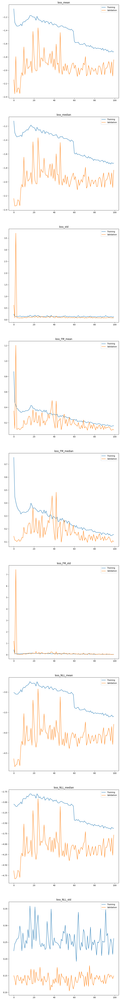

In [ ]:
visualize_training_results(r, loglog = False)

In [99]:
trainer.load_best_model()

In [100]:
model = trainer.model

In [101]:
model.eval()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=261, bias=True)
      (w_2): Linear(in_features=261, out_features=512, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
      )
      (linear1): Linear(in_features=512, out_features=1024, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=1024, out_features=512, bias=True)
      (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
  

In [30]:
trainer.load_best_model()

In [31]:
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=261, bias=True)
      (w_2): Linear(in_features=261, out_features=512, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
      )
      (linear1): Linear(in_features=512, out_features=1024, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=1024, out_features=512, bias=True)
      (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
  

In [33]:
trainer.test()

100%|██████████| 196/196 [01:46<00:00,  1.85it/s]


{'loss_mean': -2.254023313522339,
 'loss_median': -2.405630350112915,
 'loss_std': 1.4353805780410767,
 'loss_FM_mean': 0.41987359523773193,
 'loss_FM_median': 0.1052255779504776,
 'loss_FM_std': 2.8629708290100098,
 'loss_NLL_mean': -4.927920818328857,
 'loss_NLL_median': -4.925858020782471,
 'loss_NLL_std': 0.13254708051681519}

In [34]:
#?ModelToPosteriorCNF

In [35]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    #device = torch.device("cpu")
    name = "full_model",
    target_device = torch.device("cpu")
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    sample_only_base_dist = True,
    name = "full_model_no_FM",
    target_device = torch.device("cpu")
)

benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_invgamma_gamma(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'a0': 4.4798, 'b0': 5.4798, 'a1': 5.0, 'b1': 2.0}
        def multivariate_lm_return_dict(x: torch.tensor, y: torch.tensor = None) -> dict:
            
            beta_dist = pyro.distributions.Gamma(a0, b0)
            beta_var = pyro.sample("beta_var", beta_dist)
        
            sigma_squared_dist = pyro.distributions.InverseGamma(a1, b1)
            sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist)

            beta_cov = torch.eye(x.shape[1]) * beta_var # the covariance matrix of the parameters of the linear model
            beta = pyro.sample("beta", pyro.distributions.MultivariateNormal(torch.zeros(x.shape[1]), beta_cov)) # the parameters of the linear model

            mean = torch.matmul(x, beta)

            with pyro.plate("data", x.shape[0]):
                y = pyro.sample("obs", pyro.distributions.Normal(mean, sigma_squared), obs=y)

            return {
                        "x": x,
                        "y": y,
          

In [36]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=1_000)

vi = Variational_Inference(
    pprogram=pprogram1,
    guide = None,
    n_steps = 2000,
    n_samples=1_000,
    lr = 1e-2
)


In [37]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [full_model_no_FM, hmc_sampler, vi],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

The save path is not empty and the overwrite flag is set, the results will be overwritten


In [38]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:13<22:09, 13.43s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:26<21:40, 13.27s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:39<21:22, 13.23s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:52<21:09, 13.23s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:06<21:04, 13.31s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:19<20:51, 13.32s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:32<20:33, 13.26s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:46<20:33, 13.41s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:59<20:15, 13.35s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:13<19:56, 13.30s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:26<19:46, 13.34s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:39<19:29, 13.29s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:52<19:09, 13.21s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:06<19:04, 13.31s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:19<18:52, 13.33s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:32<18:40, 13.34s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:46<18:29, 13.36s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:59<18:18, 13.40s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:12<17:58, 13.32s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:26<17:44, 13.31s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:40<17:41, 13.44s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:53<17:21, 13.36s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:06<17:05, 13.32s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:20<17:00, 13.43s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:33<16:43, 13.39s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:46<16:26, 13.34s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:00<16:17, 13.39s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:13<16:04, 13.40s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:26<15:50, 13.38s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:40<15:41, 13.45s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:53<15:23, 13.38s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:06<15:06, 13.34s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:20<14:50, 13.30s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:33<14:40, 13.34s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:46<14:24, 13.30s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:59<14:06, 13.23s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [08:13<13:59, 13.33s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:26<13:42, 13.27s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:39<13:27, 13.24s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:53<13:17, 13.28s/it]

....................


Sampling posterior:  41%|████      | 41/100 [09:06<13:05, 13.32s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [09:19<12:47, 13.24s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [09:33<12:39, 13.32s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:46<12:24, 13.29s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:59<12:08, 13.24s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [10:12<11:57, 13.30s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [10:26<11:49, 13.39s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [10:39<11:36, 13.39s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:52<11:18, 13.31s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [11:06<11:07, 13.36s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [11:19<10:56, 13.39s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [11:33<10:39, 13.31s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [11:46<10:30, 13.41s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:59<10:13, 13.34s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [12:13<10:01, 13.37s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [12:26<09:44, 13.29s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [12:39<09:32, 13.31s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:53<09:21, 13.37s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [13:06<09:06, 13.33s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [13:19<08:55, 13.38s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [13:33<08:40, 13.35s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [13:46<08:25, 13.31s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [14:00<08:17, 13.43s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [14:13<08:06, 13.51s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [14:27<07:50, 13.45s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [14:40<07:39, 13.52s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [14:54<07:25, 13.51s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [15:07<07:08, 13.39s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [15:20<06:55, 13.41s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [15:34<06:40, 13.34s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [15:47<06:25, 13.31s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [16:01<06:15, 13.41s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [16:14<06:01, 13.39s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [16:27<05:48, 13.40s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [16:41<05:35, 13.43s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [16:54<05:19, 13.33s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [17:07<05:04, 13.26s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [17:20<04:52, 13.29s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [17:34<04:40, 13.37s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [17:47<04:26, 13.32s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [18:01<04:13, 13.35s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [18:14<04:02, 13.45s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [18:27<03:47, 13.39s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [18:41<03:33, 13.34s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [18:54<03:21, 13.45s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [19:08<03:07, 13.39s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [19:21<02:54, 13.41s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [19:35<02:41, 13.48s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [19:48<02:27, 13.39s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [20:01<02:13, 13.36s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [20:15<02:01, 13.49s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [20:28<01:47, 13.43s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [20:42<01:33, 13.38s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [20:55<01:19, 13.30s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [21:08<01:06, 13.36s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [21:21<00:53, 13.33s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [21:35<00:40, 13.35s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [21:48<00:26, 13.38s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [22:02<00:13, 13.36s/it]

....................


100%|██████████| 100/100 [05:31<00:00,  3.31s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_CST_accuracy,Mean_joint_CST_roc_auc_score,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_CST_accuracy,Std_joint_CST_roc_auc_score,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,full_model,gt,19.032275,0.051928,0.49810,0.49810,2.947949,0.168902,0.150436,0.008141,0.000108,0.033370,0.033370,4.937163,0.136720,0.081056
1,full_model_no_FM,gt,19.030524,0.051866,0.49295,0.49295,3.515679,0.162535,0.144361,0.007210,0.000090,0.033508,0.033508,4.956272,0.128874,0.085197
2,Hamiltonian Monte Carlo,gt,19.016414,0.051751,0.49580,0.49580,5.211746,0.148943,0.139173,0.003209,0.000062,0.035296,0.035296,5.017644,0.093010,0.082262
3,Variational Inference with guide: AutoDiagonal...,gt,19.006313,0.051640,0.49980,0.49980,-8.027907,0.144431,0.143577,0.001640,0.000042,0.038402,0.038402,15.855987,0.086345,0.087866


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_CST_accuracy_p-value,joint_CST_roc_auc_score_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,full_model,full_model_no_FM,1.110111e-01,1.407974e-05,0.317277,0.347664,6.275353e-05,7.775544e-02,6.747487e-05
1,full_model,Hamiltonian Monte Carlo,4.813702e-18,7.558554e-17,0.587283,0.608895,1.479816e-13,2.946469e-05,4.397351e-07
2,full_model,Variational Inference with guide: AutoDiagonal...,3.896340e-18,3.896340e-18,0.753283,0.765186,1.246298e-12,1.891300e-08,9.292773e-04
3,full_model_no_FM,Hamiltonian Monte Carlo,4.266083e-18,1.200135e-15,0.667329,0.642478,4.450203e-13,1.817367e-03,1.775409e-03
4,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,3.896560e-18,4.138441e-18,0.210868,0.212283,1.683793e-13,8.347618e-06,1.234703e-01
5,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,3.896560e-18,5.648540e-17,0.588120,0.606662,1.960509e-16,6.000407e-02,5.725047e-02



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_CST_accuracy,Mean_CST_roc_auc_score,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_CST_accuracy,Std_CST_roc_auc_score
0,full_model,full_model_no_FM,0.448816,0.094432,0.633620,0.633620,0.480574,0.073444,0.069505,0.069505
1,full_model,Hamiltonian Monte Carlo,0.509999,0.298857,0.754875,0.754875,0.777931,0.330817,0.098154,0.098154
2,full_model,Variational Inference with guide: AutoDiagonal...,0.568960,1.013564,0.941685,0.941685,0.813211,0.436434,0.029816,0.029816
3,full_model_no_FM,Hamiltonian Monte Carlo,0.481300,0.190103,0.706960,0.706960,0.761848,0.268657,0.090745,0.090745
4,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.546014,0.886966,0.934365,0.934365,0.799251,0.364363,0.029025,0.029025
5,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,0.386863,0.552961,0.892525,0.892525,0.211581,0.266127,0.026567,0.026567


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,CST_accuracy_p-value,CST_roc_auc_score_p-value
0,full_model,full_model_no_FM,full_model,Hamiltonian Monte Carlo,0.122831,2.240469e-12,3.844998e-17,3.967124e-17
1,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoDiagonal...,0.000324,2.562144e-34,2.559115e-34,2.559115e-34
2,full_model,full_model_no_FM,full_model_no_FM,Hamiltonian Monte Carlo,0.807915,1.211034e-03,6.185582e-09,6.277019e-09
3,full_model,full_model_no_FM,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.024195,2.562144e-34,2.559403e-34,2.559835e-34
4,full_model,full_model_no_FM,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,0.059420,4.266336e-34,2.797591e-34,2.798536e-34
5,full_model,Hamiltonian Monte Carlo,full_model,Variational Inference with guide: AutoDiagonal...,0.026597,4.154322e-26,3.355868e-27,3.355423e-27
6,full_model,Hamiltonian Monte Carlo,full_model_no_FM,Hamiltonian Monte Carlo,0.107623,2.206057e-05,4.811013e-05,4.938552e-05
7,full_model,Hamiltonian Monte Carlo,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.340011,1.749558e-24,3.412532e-26,3.502005e-26
8,full_model,Hamiltonian Monte Carlo,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,0.003276,7.971863e-16,2.584041e-20,2.735545e-20
9,full_model,Variational Inference with guide: AutoDiagonal...,full_model_no_FM,Hamiltonian Monte Carlo,0.000263,4.850188e-29,7.444392e-30,7.550232e-30


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                                         full_model  gt   
  1                                   full_model_no_FM  gt   
  2                            Hamiltonian Monte Carlo  gt   
  3  Variational Inference with guide: AutoDiagonal...  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          19.032275            0.051928   
  1                                          19.030524            0.051866   
  2                                          19.016414            0.051751   
  3                                          19.006313            0.051640   
  
     Mean_joint_CST_accuracy  Mean_joint_CST_roc_auc_score  \
  0                  0.49810                       0.49810   
  1                  0.49295                       0.49295   
  2                  0.49580                       0.49580   
  3 

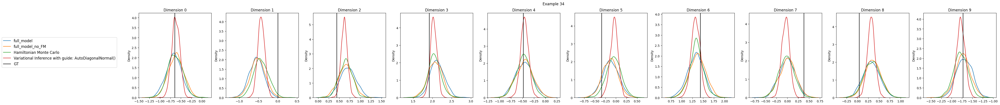

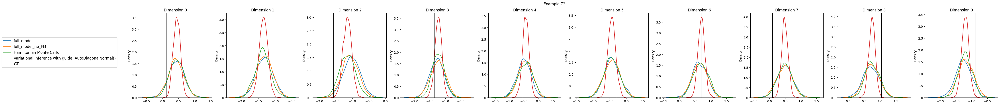

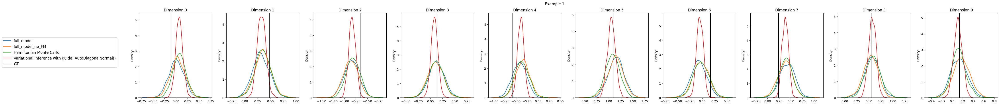

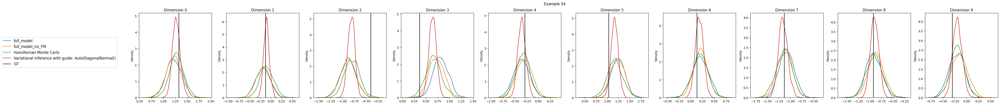

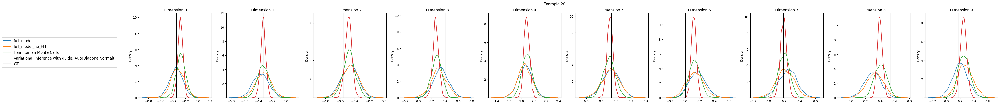

In [39]:
evaluation.plot_results()